# Project 2: Road Segmentation

In the project, we implemented a full routine for training and validating DL models to perform pixel-wise classification.

* Dataset: we use the dataset provided on AIcrowd, which contains aerial images and their groundtruth mask for training. We expect our dataset to provide a second image where each pixel is classified as *Road (white)* or *Not Road (black)*.
* Model: We need a suitable model that provides spatial outputs. We decided to use U-Net, a commonly used CNN model for image segmentation.

## 1. Setup

Please run the following cell if you are running this Notebook from Google Colab.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### 1.1 Install dependencies

Please run this cell to install the packages

In [2]:
import sys
!{sys.executable} -m pip install torch torchvision
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install tqdm

### 1.2 Check if GPU available
We need a GPU to train large model. It should print `True` if the GPU is available.

In [4]:
import torch
print(torch.cuda.is_available())

True


### 1.3 Random seed
Here we set the seed value to initialise the random number generator of PyTorch.

In [5]:
seed = 323232
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

## 2. Data Preprocessing

First we have to define the dataset directory.

In [6]:
data_root = '/content/drive/MyDrive/ML_Project2/epfl_road-segmentation'     # Please replace with your own path to epfl_road-segmentation folder

### 2.1 Initialization of the Dataloader

In [7]:
import os
from torch.utils.data import dataset
from torch.utils.data import DataLoader
from torchvision.transforms.functional import (to_tensor, normalize, resize, hflip, vflip, rotate)
import numpy as np
from PIL import Image

# Constants for normalizing image values
image_mean = [0.485, 0.456, 0.406]
image_std = [0.229, 0.224, 0.225]

class RoadSegmentationDataset(dataset.Dataset):
    '''
        Custom Dataset class that loads images and ground truth segmentation
        masks from a directory.
    '''

    # Label class descriptions
    LABEL_CLASSES = ('No Road', 'Road')

    def __init__(self, data_root, transform=None, file_list=None):
        '''
            Dataset class constructor.

            Args:
                data_root (str): Root directory containing the images and ground truth folders.
                transform (callable, optional): Transformations to apply to images and groundtruth masks.
                file_list (list, optional): List of specific files from the dataset.
        '''
        super().__init__()

        self.data_root = data_root
        self.transform = transform

        if file_list is not None:
            # Use provided file list
            self.data = file_list
        else:
            # Automatically gather all PNG files from the images folder
            imgs_folder = os.path.join(self.data_root, 'images')
            self.data = [f for f in os.listdir(imgs_folder) if f.endswith('.png')]

    def __len__(self):
        '''
        Returns:
            int: Number of samples in the dataset.
        '''
        return len(self.data)

    def __getitem__(self, idx):
        '''
        Loads and prepares images and corresponding labels (segmentation masks).

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            Tuple[torch.Tensor, torch.Tensor]: Transformed image and its corresponding mask.
        '''
        item = self.data[idx]

        # Load the image
        image_path = os.path.join(self.data_root, 'images', item)
        image = Image.open(image_path)

        # Load the segmentation mask (ground truth)
        label_path = os.path.join(self.data_root, 'groundtruth', item)
        mask = Image.open(label_path).convert('L')  # Convert to grayscale

        # Apply transformations (if specified)
        if self.transform:
            image, mask = self.transform(image, mask)
        else:
            # Default processing when no transformation is provided
            image = to_tensor(image)  # Convert image to tensor
            image = normalize(image, image_mean, image_std)  # Normalize image

            mask = np.array(mask, dtype=np.int64)  # Convert mask to NumPy array

            # Map pixel values to binary labels (0 for background, 1 for road)
            white_threshold = 100  # Threshold to distinguish road vs. non-road pixels
            mask = np.where(mask > white_threshold, 1, 0)
            mask = torch.from_numpy(mask).long()  # Convert mask to tensor

        return image, mask


# DataLoader function
def load_dataloader(data_root, batch_size, split='training', file_list=None, transform=None):
    '''
    Creates a DataLoader for the RoadSegmentationDataset.

    Args:
        data_root (str): Root directory of the dataset.
        batch_size (int): Number of samples per batch.
        split (str): Split type ('training' or 'validation'). Defaults to 'training'.
        file_list (list, optional): Specific file list to load.
        transform (callable, optional): Transformation function for the dataset.

    Returns:
        torch.utils.data.DataLoader: DataLoader object for the specified dataset split.
    '''
    dataset = RoadSegmentationDataset(
        data_root=os.path.join(data_root, 'training'),  # Path to training folder
        transform=transform,
        file_list=file_list
    )
    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=(split == 'training'),  # Shuffle only for training split
        num_workers=2  # Use two CPU threads for loading data
    )


### 2.2 Transformations
We define some transformations to be used later for data augmentation.

In [8]:
import random
import torchvision.transforms as T

# Custom transform function for image and mask
def transform_image_and_mask(image, mask):
    '''
    Applies transformations to both the image and the groundtruth mask.

    Args:
        image (PIL.Image): RGB input image.
        mask (PIL.Image): Groundtruth mask.

    Returns:
        Tuple[torch.Tensor, torch.Tensor]: Transformed image and mask.
    '''

    # Random horizontal flip
    if random.random() > 0.5:
        image = hflip(image)
        mask = hflip(mask)

    # Random vertical flip
    if random.random() > 0.5:
        image = vflip(image)
        mask = vflip(mask)

    # Random rotation by an angle between -45 and 45 degrees
    if random.random() > 0.5:
        angle = random.randint(-45, 45)
        image = rotate(image, angle)
        mask = rotate(mask, angle)

    # Apply non-geometric transformations to the image only
    if random.random() > 0.5:
        image = T.RandomGrayscale(p=0.5)(image)  # Convert to grayscale

    if random.random() > 0.5:
        image = T.RandomApply([T.GaussianBlur(kernel_size=7)], p=0.5)(image)  # Apply Gaussian blur

    if random.random() > 0.5:
        image = T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.4)(image)  # Color jitter

    if random.random() > 0.5:
        image = T.RandomAutocontrast(p=0.5)(image)  # Apply autocontrast

    # Convert image to tensor and normalize
    image = to_tensor(image)
    image = normalize(image, image_mean, image_std)

    # Convert mask to NumPy array temporarily for processing
    mask = np.array(mask, dtype=np.int64)

    # Map pixel values to binary labels (0 for background, 1 for road)
    white_threshold = 100  # Ensure no grayish pixels are misclassified
    mask = np.where(mask > white_threshold, 1, 0)  # Map the pixels to a class
    mask = torch.from_numpy(mask).long()  # Convert mask to tensor

    return image, mask

### 2.3 Files management and sets splitting
Before processing our dataset, we have to create some functions to manipulate them. The dataset is then separated into training, validation and test sets.

In [9]:
import glob

def delete_augmented_images(data_root):
    '''
    Deletes all augmented image and groundtruth files from the specified dataset directory.

    Args:
        data_root (str): Root directory of the dataset.
    '''

    # Counter to track the number of deleted images
    deleted_images = 0

    # Find and delete augmented image files in the images folder
    for file_path in glob.glob(os.path.join(data_root, 'training', 'images', 'satImage_*_augmented.png')):
        os.remove(file_path)  # Delete the file
        deleted_images += 1  # Increment the counter

    # Print the total number of deleted augmented image files
    print("Deleted images:", deleted_images)

    # Counter to track the number of deleted groundtruth files
    deleted_gt = 0

    # Find and delete augmented groundtruth files in the groundtruth folder
    for file_path in glob.glob(os.path.join(data_root, 'training', 'groundtruth', 'satImage_*_augmented.png')):
        os.remove(file_path)  # Delete the file
        deleted_gt += 1  # Increment the counter

    # Print the total number of deleted augmented groundtruth files
    print("Deleted groundtruth:", deleted_gt)


In [10]:
import os
import random

# Delete already augmented images if there is any
delete_augmented_images(data_root)

# List all image files in the training directory
image_files = sorted([f for f in os.listdir(os.path.join(data_root, 'training', 'images')) if f.endswith(".png")])
groundtruth_files = sorted([f for f in os.listdir(os.path.join(data_root, 'training', 'groundtruth')) if f.endswith(".png")])

# Ensure the same filenames exist in both directories
assert len(image_files) == len(groundtruth_files), "Mismatch between image and groundtruth files."
assert all(img == gt for img, gt in zip(image_files, groundtruth_files)), "Image and groundtruth filenames do not match."

# Dataset splitting
random.seed(60)
random.shuffle(image_files)

train_split = int(0.55 * len(image_files))  # 55% of the dataset for training
val_split = int(0.35 * len(image_files))  # 35% for validation and the rest 10% for testing

# Save the images into different sets
data_splits = {
    'train': image_files[:train_split],
    'val': image_files[train_split:train_split + val_split],
    'test': image_files[train_split + val_split:],
    'augmented': []
}

print("Nb train:", len(data_splits['train']), "Nb val:", len(data_splits['val']), "Nb test:", len(data_splits['test']))

Deleted images: 100
Deleted groundtruth: 100
Nb train: 55 Nb val: 35 Nb test: 10


### 2.4 Applying data augmentation
Data augmentation is applied on the full dataset, and the augmented images and masks are saved. Validation and test sets are kept unchanged.

In [74]:
import os
from torchvision.transforms.functional import to_pil_image

# Delete already augmented images if there is any
delete_augmented_images(data_root)

# Initialize train set images
dataset_train = RoadSegmentationDataset(os.path.join(data_root, 'training'), file_list=data_splits['train'])
# Initialize augmented images
dataset_train_transformed = RoadSegmentationDataset(os.path.join(data_root, 'training'), transform=transform_image_and_mask)

# List to store the filename of all augmented images and masks
data_splits['augmented'] = []
# Create augmented images and save them
for idx_trans in range(len(dataset_train_transformed)):
    data_transformed, target_transformed = dataset_train_transformed.__getitem__(idx_trans)
    # Scale the transformed mask values to the range [0, 255]
    # Save the transformed image with custom filename
    denormalized_data = data_transformed * torch.tensor(image_std).view(-1, 1, 1) + torch.tensor(image_mean).view(-1, 1, 1)
    file_name = f'satImage_{idx_trans+1:03}_augmented.png'
    transformed_image_path = os.path.join(data_root, 'training', 'images', file_name)
    to_pil_image(denormalized_data).save(transformed_image_path)

    target_transformed = target_transformed * 255  # Scale 0 -> 0 (black) and 1 -> 255 (white)
    target_transformed = target_transformed.type(torch.uint8)  # Ensure it's uint8 for saving as image

    # Save the transformed mask with custom filename (optional)
    transformed_mask_path = os.path.join(data_root, 'training', 'groundtruth', file_name)
    to_pil_image(target_transformed.unsqueeze(0)).save(transformed_mask_path)
    # Add the augmented image index to the list
    data_splits['augmented'].append(file_name)

print("Augmented images:", len(data_splits['augmented']))

Deleted images: 100
Deleted groundtruth: 100
Augmented images: 100


### 2.5 Visualization of some images
Augmented images and masks can also be open and visualized directly in the training folder. If a geometric transform is performed on the image (rotation, vertical or horizontal filp...), the same transform must also be applied on the mask, and the mask should remain aligned with the images.
Non-geometric transforms (color jitter, gaussian blur, grayscale...) don't need to be applied on the mask.

Image tensor size: torch.Size([3, 400, 400])
Label tensor size: torch.Size([400, 400])


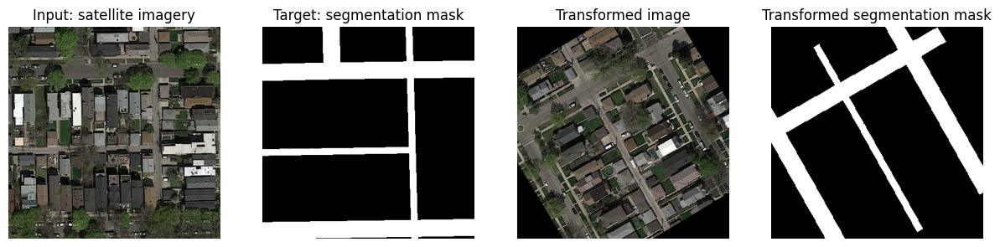

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

# draw a random sample
idx = torch.randint(0, len(dataset_train), (1,))
data, target = dataset_train.__getitem__(idx)
data_transformed, target_transformed = dataset_train_transformed.__getitem__(idx)
# Apply transformations

print(f'Image tensor size: {data.size()}')
print(f'Label tensor size: {target.shape}')

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(15, 5))  # 1 row, 3 columns

# Input image
# Unnormalize the image
unnormalized_data = data * torch.tensor(image_std).view(-1, 1, 1) + torch.tensor(image_mean).view(-1, 1, 1)
axes[0].imshow(unnormalized_data.permute(1, 2, 0).numpy())
axes[0].set_title('Input: satellite imagery')
axes[0].axis('off')

# Segmentation mask
axes[1].imshow(target.squeeze().numpy(), cmap='gray')
axes[1].set_title('Target: segmentation mask')
axes[1].axis('off')

# Unnormalize the image
unnormalized_data_transformed = data_transformed * torch.tensor(image_std).view(-1, 1, 1) + torch.tensor(image_mean).view(-1, 1, 1)
axes[2].imshow(unnormalized_data_transformed.permute(1, 2, 0).numpy())
axes[2].set_title('Transformed image')
axes[2].axis('off')

axes[3].imshow(target_transformed.squeeze().numpy(), cmap='gray')
axes[3].set_title('Transformed segmentation mask')
axes[3].axis('off')

plt.show()

If the transforms are done correctly, there shouldn't be any missalignment.

## 3. Model Training

### 3.1 Model Architecture
We used a U-Net model following this architecture:

### Encoder (Downsampling Path):
* Block 1:
 *   Input: RGB image with 3 channels.
 *   Two convolutional layers with 64 filters each, followed by batch normalization, ReLU activation, and optional dropout (0.1 probability).
 *   Max pooling with a kernel size of 2 reduces the spatial dimensions by half.

* Block 2:

 *   Input: Output from the previous pooling layer.
 *   Two convolutional layers with 128 filters each, similar to the first block.
 *   Max pooling with a kernel size of 2.

* Block 3:

 *   Input: Output from the previous pooling layer.
 *   Two convolutional layers with 256 filters each.
 *   Max pooling with a kernel size of 2.

* Block 4:

 *   Input: Output from the previous pooling layer.
 *   Two convolutional layers with 512 filters each.
 *   Max pooling with a kernel size of 2.

### Bottleneck:
 *   Two convolutional layers with 1024 filters each.
 *   Batch normalization and ReLU activation are used after each convolution.
 *   Dropout with a rate of 0.4 (to prevent overfitting).


### Decoder (Upsampling Path):
* Block 4:
  *    Input: Bottleneck output.
  *    Transpose convolution upsamples the feature map to the spatial size of the encoder's fourth block.
  *    Skip connection: The upsampled feature map is concatenated with the output from the encoder's fourth block.
  *    Two convolutional layers with 512 filters each.

* Block 3:
  *     Input: Output from the previous decoder block.
  *     Transpose convolution upsamples the feature map to the spatial size of the encoder's third block.
  *     Skip connection: The upsampled feature map is concatenated with the output from the encoder's third block.
  *     Two convolutional layers with 256 filters each.

* Block 2:
  *     Input: Output from the previous decoder block.
  *     Transpose convolution upsamples the feature map to the spatial size of the encoder's second block.
  *     Skip connection: The upsampled feature map is concatenated with the output from the encoder's second block.
  *     Two convolutional layers with 128 filters each.

* Block 1:
  *     Input: Output from the previous decoder block.
  *     Transpose convolution upsamples the feature map to the spatial size of the encoder's first block.
  *     Skip connection: The upsampled feature map is concatenated with the output from the encoder's first block.
  *     Two convolutional layers with 64 filters each.

* Final Output:
  *     A single convolutional layer with a kernel size of 1 reduces the depth of the feature map to 1.
  *     The output represents a segmentation map, where each pixel corresponds to the binary segmentation.

In [19]:
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Downsampling (Encoder)
        self.encoder1 = self.conv_block(3, 64, dropout_rate=0.1)
        self.pool1 = nn.MaxPool2d(2)

        self.encoder2 = self.conv_block(64, 128, dropout_rate=0.2)
        self.pool2 = nn.MaxPool2d(2)

        self.encoder3 = self.conv_block(128, 256, dropout_rate=0.2)
        self.pool3 = nn.MaxPool2d(2)

        self.encoder4 = self.conv_block(256, 512, dropout_rate=0.3)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024, dropout_rate=0.4)

        # Upsampling (Decoder)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = self.conv_block(1024, 512, dropout_rate=0.3)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = self.conv_block(512, 256, dropout_rate=0.2)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self.conv_block(256, 128, dropout_rate=0.2)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = self.conv_block(128, 64, dropout_rate=0.1)

        # Final output
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def conv_block(self, in_channels, out_channels, dropout_rate=0.0):
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=dropout_rate) if dropout_rate > 0 else nn.Identity(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=dropout_rate) if dropout_rate > 0 else nn.Identity(),
        ]
        return nn.Sequential(*layers)

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))

        # Decoder
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((enc4, dec4), dim=1)  # Skip connection
        dec4 = self.decoder4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((enc3, dec3), dim=1)
        dec3 = self.decoder3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((enc2, dec2), dim=1)
        dec2 = self.decoder2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((enc1, dec1), dim=1)
        dec1 = self.decoder1(dec1)

        return self.final(dec1)

### 3.2 Test of the model

In [26]:
dataloader_train = load_dataloader(data_root, batch_size=2, split='training')
model = UNet()

data, _ = iter(dataloader_train).__next__()
pred = model(data)

# Binary outputs
assert pred.size(1) == len(dataset_train.LABEL_CLASSES)-1, f'ERROR: invalid number of model output channels (should be # classes {len(dataset_train.LABEL_CLASSES)}, got {pred.size(1)})'
# Spatial alignment
assert pred.size(2) == data.size(2), f'ERROR: invalid spatial height of model output (should be {data.size(2)}, got {pred.size(2)})'
assert pred.size(3) == data.size(3), f'ERROR: invalid spatial width of model output (should be {data.size(3)}, got {pred.size(3)})'

### 3.3 Training Parameters
We used *Binary Cross-Entropy Loss with Logits* for the loss and *Adam* optimiser.

In [27]:
#TODO
criterion = nn.BCEWithLogitsLoss()

In [28]:
from torch.optim import Adam

def setup_optimiser(model, learning_rate, weight_decay):
    return Adam(
        model.parameters(),
        lr=learning_rate,
        weight_decay=weight_decay
    )

Some useful functions:

In [29]:
def compute_iou(pred, target, threshold=0.5):
    """
    Compute Intersection over Union (IoU) score.

    Args:
        pred (torch.Tensor): Model output logits.
        target (torch.Tensor): Ground truth binary mask.
        threshold (float): Threshold for converting logits to binary predictions.

    Returns:
        float: IoU score.
    """
    # Convert logits to binary
    pred = (torch.sigmoid(pred) > threshold).float()

    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = (pred + target).clamp(0, 1).sum(dim=(1, 2, 3))

    iou = (intersection / (union + 1e-6)).mean().item()  # Avoid division by zero

    return iou

In [30]:
from tqdm.notebook import trange  # pretty progress bar
from sklearn.metrics import f1_score

def train_epoch(data_loader, model, optimiser, device):
    """
    Perform a single training epoch.

    Args:
        data_loader (DataLoader): DataLoader for the training data.
        model (torch.nn.Module): Model to train.
        optimiser (torch.optim.Optimizer): Optimizer for parameter updates.
        criterion (torch.nn.Module): Loss function (e.g., BCEWithLogitsLoss).
        device (torch.device): Device to use (CPU or GPU).

    Returns:
        tuple: Updated model, average loss, overall accuracy, and F1 score.
    """

    # Set model to training mode
    model.train(True)
    model.to(device)

    # Initialize statistics
    loss_total = 0.0
    oa_total = 0.0
    f1_total = 0.0

    # Progress bar
    pBar = trange(len(data_loader))

    for idx, (data, target) in enumerate(data_loader):
        # Move data and target to the specified device
        data, target = data.to(device), target.to(device)

        # Reset gradients
        optimiser.zero_grad()

        # Forward pass
        pred = model(data)  # Logits output

        # Adjust target dimensions and type
        target = target.unsqueeze(1).float()

        # Loss computation
        loss = criterion(pred, target)  # BCEWithLogitsLoss

        # Backward pass and optimizer step
        loss.backward()
        optimiser.step()

        # Update loss total
        loss_total += loss.item()

        # Compute metrics
        with torch.no_grad():
            # Convert logits to probabilities and apply threshold
            yhat = (torch.sigmoid(pred) > 0.5).float()

            # Compute overall accuracy
            oa_total += torch.mean((yhat == target).float()).item()

            # Compute F1 score (IoU)
            iou = compute_iou(pred, target)
            f1_total += iou


        # Update progress bar
        pBar.set_description(
            'Loss: {:.4f}, OA: {:.2f}%, F1: {:.2f}'.format(
                loss_total / (idx + 1),
                100 * oa_total / (idx + 1),
                f1_total / (idx + 1)
            )
        )
        pBar.update(1)

    pBar.close()

    # Normalize stats
    loss_total /= len(data_loader)
    oa_total /= len(data_loader)
    f1_total /= len(data_loader)

    return model, loss_total, oa_total, f1_total

In [31]:
def validate_epoch(data_loader, model, device):  # note: no optimizer needed
    """
    Perform one epoch of validation for a given model on a dataset.

    Args:
        data_loader (DataLoader): PyTorch DataLoader for the validation dataset.
        model (nn.Module): The model to validate.
        device (torch.device): The device to run validation on (e.g., 'cuda' or 'cpu').

    Returns:
        loss_total (float): Average loss across the validation dataset.
        oa_total (float): Average overall accuracy across the validation dataset.
        f1_total (float): Average F1 score (IoU) across the validation dataset.
    """

    # Set model to evaluation mode to disable dropout/batch norm updates
    model.eval()
    model.to(device)

    # Initialize accumulators for loss, overall accuracy (OA), and F1 score (IoU)
    loss_total = 0.0
    oa_total = 0.0
    f1_total = 0.0

    # Progress bar setup for dataset iteration
    pBar = trange(len(data_loader))

    # Iterate over the validation DataLoader
    for idx, (data, target) in enumerate(data_loader):
        with torch.no_grad():  # Disable gradient computation for validation

            # Move data and target tensors to the correct device
            data, target = data.to(device), target.to(device)

            # Forward pass: compute predictions
            pred = model(data)

            # Adjust target tensor dimensions to match `pred`
            target = target.unsqueeze(1).float()

            # Compute the loss
            loss = criterion(pred, target)

            # Update loss accumulator
            loss_total += loss.item()

            # Convert predictions to binary
            yhat = (torch.sigmoid(pred) > 0.5).float()

            # Compute overall accuracy (OA)
            oa_total += torch.mean((yhat == target).float()).item()

            # Compute IoU
            iou = compute_iou(pred, target)
            f1_total += iou

            # Update the progress bar with current loss and accuracy
            pBar.set_description('Loss: {:.2f}, OA: {:.2f}'.format(
                loss_total/(idx+1),  # Average loss so far
                100 * oa_total/(idx+1)  # Average OA so far, formatted as a percentage
            ))
            pBar.update(1)  # Move progress bar forward

    pBar.close()

    # Normalize accumulated stats by the number of batches
    loss_total /= len(data_loader)
    oa_total /= len(data_loader)
    f1_total /= len(data_loader)

    return loss_total, oa_total, f1_total

### 3.4 CNN states storage
We create a new directory to store all the CNN states during training (the files could be very large).

In [32]:
import glob

os.makedirs(f'{data_root}/cnn_states/UNet', exist_ok=True)  # Create directory for saving model states if it doesn't exist

def load_model(epoch='latest'):
    """
    Load the model state from a saved file. Defaults to loading the latest saved epoch.

    Args:
        epoch (str or int): 'latest' to load the most recent model or a specific epoch number.

    Returns:
        model (torch.nn.Module): The UNet model with loaded state.
        epoch (int): The epoch number of the loaded state. Returns 0 if no saved state exists.
    """

    # Initialize a new UNet model
    model = UNet()

    # Get the list of all saved model state files in the directory
    modelStates = glob.glob(f'{data_root}/cnn_states/UNet/*.pth')

    # Check if there are any saved states and if the specified epoch is valid
    if len(modelStates) and (epoch == 'latest' or epoch > 0):

        # Extract epoch numbers from the filenames
        modelStates = [int(m.replace(f'{data_root}/cnn_states/UNet/','').replace('.pth', '')) for m in modelStates]

        # If 'latest' is specified, determine the most recent epoch
        if epoch == 'latest':
            epoch = max(modelStates)

        # Load the state dictionary for the specified epoch
        stateDict = torch.load(open(f'{data_root}/cnn_states/UNet/{epoch}.pth', 'rb'), map_location='cpu')
        model.load_state_dict(stateDict)  # Load the state into the model
    else:
        # No saved states found; return a fresh model
        epoch = 0

    return model, epoch


def save_model(model, epoch):
    """
    Save the current state of the model to a file, using the epoch number in the filename.

    Args:
        model (torch.nn.Module): The model to save.
        epoch (int): The epoch number, which is included in the filename.
    """
    # Save the model's state dictionary to the specified file
    torch.save(model.state_dict(), open(f'{data_root}/cnn_states/UNet/{epoch}.pth', 'wb'))



### 3.5 Training Loop
Now we train our model for 300 epochs.

In [33]:
from torch.optim.lr_scheduler import StepLR

# Define hyperparameters
device = 'cuda'
#device = 'cpu'        # set device to CPU if no GPU is available
start_epoch = 0        # set to 0 to start from scratch again or to 'latest' to continue training from saved checkpoint
batch_size = 16
learning_rate = 0.001
weight_decay = 0.001
num_epochs = 300

full_training_set = data_splits['train'] + data_splits['augmented'] # The whole training set, 55 initial images + 100 augmented images = 155 training images

# Initialise data loaders
dl_train = load_dataloader(data_root, batch_size, 'training', file_list=full_training_set)  # train dataloader
dl_val = load_dataloader(data_root, batch_size, 'validation', file_list=data_splits['val']) # validation dataloader

# Load model
model, epoch = load_model(epoch=start_epoch)
model = model.to(device)
optim = setup_optimiser(model, learning_rate, weight_decay)
scheduler = StepLR(optim, step_size=25, gamma=0.7)  # Reduce LR by a factor of 0.7 every 25 epochs

# Lists to store all metrics during training
loss_training = []
oa_training = []
f1_training = []
loss_validation = []
oa_validation = []
f1_validation = []

# Do epochs
while epoch < num_epochs:

  # Training
  model, loss_train, oa_train, f1_train = train_epoch(dl_train, model, optim, device)

  # Validation
  loss_val, oa_val, f1_val = validate_epoch(dl_val, model, device)

  print(f'[Ep. {epoch+1}/{num_epochs}] '
        f'Loss train: {loss_train:.2f}, val: {loss_val:.2f}; '
        f'OA train: {100*oa_train:.2f}, val: {100*oa_val:.2f}; '
        f'F1 train: {f1_train:.2f}, val: {f1_val:.2f}')

  # Add the calculated metrics in the corresponding lists
  loss_training.append(loss_train)
  oa_training.append(oa_train)
  f1_training.append(f1_train)
  loss_validation.append(loss_val)
  oa_validation.append(oa_val)
  f1_validation.append(f1_val)

  scheduler.step()  # Update learning rate
  epoch += 1
  # Save model
  save_model(model, epoch)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 1/300] Loss train: 0.63, val: 0.64; OA train: 62.80, val: 70.16; F1 train: 0.22, val: 0.23


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 2/300] Loss train: 0.50, val: 2.59; OA train: 78.18, val: 26.86; F1 train: 0.16, val: 0.21


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 3/300] Loss train: 0.47, val: 0.53; OA train: 80.28, val: 73.33; F1 train: 0.14, val: 0.29


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 4/300] Loss train: 0.45, val: 0.47; OA train: 80.86, val: 80.40; F1 train: 0.16, val: 0.27


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 5/300] Loss train: 0.43, val: 0.44; OA train: 82.11, val: 81.07; F1 train: 0.16, val: 0.32


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 6/300] Loss train: 0.44, val: 0.44; OA train: 80.97, val: 81.81; F1 train: 0.18, val: 0.24


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 7/300] Loss train: 0.43, val: 0.43; OA train: 81.54, val: 82.61; F1 train: 0.15, val: 0.34


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 8/300] Loss train: 0.42, val: 0.44; OA train: 81.56, val: 82.02; F1 train: 0.20, val: 0.33


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 9/300] Loss train: 0.42, val: 0.42; OA train: 82.01, val: 82.02; F1 train: 0.16, val: 0.37


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 10/300] Loss train: 0.42, val: 0.42; OA train: 81.50, val: 80.64; F1 train: 0.16, val: 0.39


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 11/300] Loss train: 0.41, val: 0.40; OA train: 81.44, val: 83.51; F1 train: 0.17, val: 0.31


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 12/300] Loss train: 0.41, val: 0.40; OA train: 81.59, val: 82.50; F1 train: 0.18, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 13/300] Loss train: 0.41, val: 0.37; OA train: 81.79, val: 83.44; F1 train: 0.17, val: 0.30


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 14/300] Loss train: 0.41, val: 0.38; OA train: 81.52, val: 82.80; F1 train: 0.19, val: 0.21


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 15/300] Loss train: 0.40, val: 0.37; OA train: 82.24, val: 83.24; F1 train: 0.18, val: 0.39


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 16/300] Loss train: 0.40, val: 0.38; OA train: 81.70, val: 82.89; F1 train: 0.23, val: 0.29


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 17/300] Loss train: 0.40, val: 0.36; OA train: 81.91, val: 83.56; F1 train: 0.13, val: 0.29


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 18/300] Loss train: 0.40, val: 0.42; OA train: 82.01, val: 83.03; F1 train: 0.22, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 19/300] Loss train: 0.39, val: 0.42; OA train: 82.47, val: 83.31; F1 train: 0.21, val: 0.32


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 20/300] Loss train: 0.39, val: 0.37; OA train: 81.98, val: 81.91; F1 train: 0.22, val: 0.15


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 21/300] Loss train: 0.39, val: 0.37; OA train: 82.28, val: 82.73; F1 train: 0.19, val: 0.21


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 22/300] Loss train: 0.39, val: 0.34; OA train: 81.97, val: 84.27; F1 train: 0.18, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 23/300] Loss train: 0.39, val: 0.35; OA train: 82.13, val: 84.03; F1 train: 0.23, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 24/300] Loss train: 0.39, val: 0.36; OA train: 82.56, val: 83.03; F1 train: 0.21, val: 0.22


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 25/300] Loss train: 0.39, val: 0.38; OA train: 82.47, val: 83.53; F1 train: 0.18, val: 0.26


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 26/300] Loss train: 0.39, val: 0.35; OA train: 82.51, val: 85.04; F1 train: 0.26, val: 0.41


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 27/300] Loss train: 0.38, val: 0.36; OA train: 82.72, val: 83.93; F1 train: 0.23, val: 0.41


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 28/300] Loss train: 0.39, val: 0.36; OA train: 82.49, val: 82.02; F1 train: 0.21, val: 0.16


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 29/300] Loss train: 0.38, val: 0.35; OA train: 82.25, val: 82.15; F1 train: 0.23, val: 0.16


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 30/300] Loss train: 0.38, val: 0.34; OA train: 82.82, val: 84.13; F1 train: 0.21, val: 0.29


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 31/300] Loss train: 0.37, val: 0.34; OA train: 83.07, val: 84.54; F1 train: 0.26, val: 0.34


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 32/300] Loss train: 0.36, val: 0.32; OA train: 83.42, val: 84.70; F1 train: 0.27, val: 0.35


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 33/300] Loss train: 0.37, val: 0.34; OA train: 82.73, val: 84.36; F1 train: 0.24, val: 0.31


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 34/300] Loss train: 0.36, val: 0.32; OA train: 83.53, val: 85.18; F1 train: 0.25, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 35/300] Loss train: 0.37, val: 0.33; OA train: 83.62, val: 84.90; F1 train: 0.27, val: 0.34


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 36/300] Loss train: 0.37, val: 0.31; OA train: 83.29, val: 85.35; F1 train: 0.24, val: 0.38


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 37/300] Loss train: 0.37, val: 0.31; OA train: 83.02, val: 85.41; F1 train: 0.28, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 38/300] Loss train: 0.37, val: 0.33; OA train: 83.40, val: 84.77; F1 train: 0.24, val: 0.33


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 39/300] Loss train: 0.36, val: 0.32; OA train: 83.43, val: 85.95; F1 train: 0.27, val: 0.43


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 40/300] Loss train: 0.37, val: 0.33; OA train: 83.34, val: 85.25; F1 train: 0.25, val: 0.37


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 41/300] Loss train: 0.37, val: 0.33; OA train: 83.37, val: 85.30; F1 train: 0.28, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 42/300] Loss train: 0.36, val: 0.31; OA train: 83.48, val: 86.41; F1 train: 0.30, val: 0.46


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 43/300] Loss train: 0.37, val: 0.34; OA train: 83.43, val: 83.97; F1 train: 0.29, val: 0.46


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 44/300] Loss train: 0.37, val: 0.33; OA train: 83.51, val: 85.21; F1 train: 0.25, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 45/300] Loss train: 0.36, val: 0.33; OA train: 84.31, val: 84.68; F1 train: 0.29, val: 0.33


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 46/300] Loss train: 0.36, val: 0.37; OA train: 83.47, val: 83.10; F1 train: 0.28, val: 0.22


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 47/300] Loss train: 0.36, val: 0.33; OA train: 83.66, val: 84.06; F1 train: 0.28, val: 0.28


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 48/300] Loss train: 0.35, val: 0.31; OA train: 84.53, val: 85.42; F1 train: 0.32, val: 0.36


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 49/300] Loss train: 0.35, val: 0.34; OA train: 84.34, val: 85.57; F1 train: 0.33, val: 0.47


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 50/300] Loss train: 0.34, val: 0.31; OA train: 84.91, val: 85.77; F1 train: 0.32, val: 0.38


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 51/300] Loss train: 0.35, val: 0.31; OA train: 84.25, val: 85.92; F1 train: 0.31, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 52/300] Loss train: 0.36, val: 0.33; OA train: 83.18, val: 84.30; F1 train: 0.29, val: 0.29


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 53/300] Loss train: 0.36, val: 0.32; OA train: 84.16, val: 85.11; F1 train: 0.29, val: 0.34


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 54/300] Loss train: 0.36, val: 0.34; OA train: 83.63, val: 83.06; F1 train: 0.30, val: 0.21


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 55/300] Loss train: 0.35, val: 0.31; OA train: 84.39, val: 85.73; F1 train: 0.31, val: 0.38


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 56/300] Loss train: 0.35, val: 0.30; OA train: 84.65, val: 86.59; F1 train: 0.32, val: 0.49


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 57/300] Loss train: 0.35, val: 0.31; OA train: 83.47, val: 86.34; F1 train: 0.33, val: 0.42


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 58/300] Loss train: 0.35, val: 0.30; OA train: 83.94, val: 85.98; F1 train: 0.31, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 59/300] Loss train: 0.34, val: 0.35; OA train: 84.65, val: 84.16; F1 train: 0.33, val: 0.30


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 60/300] Loss train: 0.35, val: 0.30; OA train: 84.18, val: 87.00; F1 train: 0.31, val: 0.50


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 61/300] Loss train: 0.34, val: 0.30; OA train: 84.15, val: 86.24; F1 train: 0.31, val: 0.40


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 62/300] Loss train: 0.34, val: 0.29; OA train: 84.70, val: 87.15; F1 train: 0.36, val: 0.47


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 63/300] Loss train: 0.34, val: 0.30; OA train: 84.68, val: 86.04; F1 train: 0.33, val: 0.38


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 64/300] Loss train: 0.33, val: 0.29; OA train: 84.87, val: 86.71; F1 train: 0.35, val: 0.43


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 65/300] Loss train: 0.33, val: 0.28; OA train: 85.37, val: 87.59; F1 train: 0.37, val: 0.50


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 66/300] Loss train: 0.33, val: 0.29; OA train: 85.34, val: 86.77; F1 train: 0.36, val: 0.41


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 67/300] Loss train: 0.32, val: 0.28; OA train: 85.66, val: 87.84; F1 train: 0.38, val: 0.50


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 68/300] Loss train: 0.32, val: 0.29; OA train: 85.45, val: 86.69; F1 train: 0.36, val: 0.41


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 69/300] Loss train: 0.32, val: 0.28; OA train: 85.52, val: 87.58; F1 train: 0.36, val: 0.46


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 70/300] Loss train: 0.33, val: 0.28; OA train: 85.06, val: 87.24; F1 train: 0.37, val: 0.51


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 71/300] Loss train: 0.32, val: 0.27; OA train: 85.96, val: 88.15; F1 train: 0.39, val: 0.57


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 72/300] Loss train: 0.31, val: 0.27; OA train: 86.54, val: 87.68; F1 train: 0.42, val: 0.56


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 73/300] Loss train: 0.31, val: 0.27; OA train: 86.10, val: 87.66; F1 train: 0.41, val: 0.47


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 74/300] Loss train: 0.31, val: 0.32; OA train: 86.16, val: 85.43; F1 train: 0.40, val: 0.50


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 75/300] Loss train: 0.31, val: 0.25; OA train: 86.57, val: 89.60; F1 train: 0.40, val: 0.56


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 76/300] Loss train: 0.30, val: 0.26; OA train: 86.43, val: 88.24; F1 train: 0.42, val: 0.59


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 77/300] Loss train: 0.30, val: 0.25; OA train: 87.14, val: 88.92; F1 train: 0.42, val: 0.56


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 78/300] Loss train: 0.29, val: 0.25; OA train: 87.34, val: 89.33; F1 train: 0.44, val: 0.59


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 79/300] Loss train: 0.29, val: 0.25; OA train: 87.06, val: 89.33; F1 train: 0.42, val: 0.58


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 80/300] Loss train: 0.28, val: 0.24; OA train: 88.17, val: 89.67; F1 train: 0.46, val: 0.59


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 81/300] Loss train: 0.28, val: 0.26; OA train: 87.66, val: 88.30; F1 train: 0.48, val: 0.58


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 82/300] Loss train: 0.27, val: 0.27; OA train: 88.52, val: 87.86; F1 train: 0.46, val: 0.44


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 83/300] Loss train: 0.27, val: 0.25; OA train: 88.57, val: 89.33; F1 train: 0.50, val: 0.63


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 84/300] Loss train: 0.26, val: 0.25; OA train: 88.79, val: 89.27; F1 train: 0.49, val: 0.53


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 85/300] Loss train: 0.26, val: 0.22; OA train: 89.02, val: 90.77; F1 train: 0.50, val: 0.61


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 86/300] Loss train: 0.26, val: 0.21; OA train: 89.10, val: 91.23; F1 train: 0.51, val: 0.64


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 87/300] Loss train: 0.25, val: 0.21; OA train: 89.63, val: 91.45; F1 train: 0.52, val: 0.65


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 88/300] Loss train: 0.25, val: 0.21; OA train: 89.66, val: 91.45; F1 train: 0.51, val: 0.64


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 89/300] Loss train: 0.24, val: 0.21; OA train: 90.06, val: 91.20; F1 train: 0.53, val: 0.63


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 90/300] Loss train: 0.25, val: 0.22; OA train: 89.75, val: 91.10; F1 train: 0.54, val: 0.62


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 91/300] Loss train: 0.23, val: 0.20; OA train: 90.28, val: 91.45; F1 train: 0.53, val: 0.66


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 92/300] Loss train: 0.23, val: 0.19; OA train: 90.42, val: 92.10; F1 train: 0.55, val: 0.67


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 93/300] Loss train: 0.23, val: 0.20; OA train: 90.76, val: 91.70; F1 train: 0.55, val: 0.65


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 94/300] Loss train: 0.23, val: 0.20; OA train: 90.68, val: 91.93; F1 train: 0.56, val: 0.65


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 95/300] Loss train: 0.22, val: 0.19; OA train: 91.10, val: 92.13; F1 train: 0.57, val: 0.66


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 96/300] Loss train: 0.22, val: 0.19; OA train: 91.11, val: 92.55; F1 train: 0.58, val: 0.68


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 97/300] Loss train: 0.22, val: 0.19; OA train: 91.35, val: 92.07; F1 train: 0.59, val: 0.66


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 98/300] Loss train: 0.22, val: 0.19; OA train: 91.29, val: 92.05; F1 train: 0.58, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 99/300] Loss train: 0.21, val: 0.19; OA train: 91.25, val: 92.50; F1 train: 0.59, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 100/300] Loss train: 0.22, val: 0.18; OA train: 90.82, val: 92.65; F1 train: 0.57, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 101/300] Loss train: 0.22, val: 0.17; OA train: 91.00, val: 92.83; F1 train: 0.56, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 102/300] Loss train: 0.21, val: 0.19; OA train: 91.21, val: 92.39; F1 train: 0.58, val: 0.67


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 103/300] Loss train: 0.21, val: 0.18; OA train: 91.45, val: 92.67; F1 train: 0.59, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 104/300] Loss train: 0.20, val: 0.17; OA train: 91.89, val: 92.85; F1 train: 0.60, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 105/300] Loss train: 0.20, val: 0.17; OA train: 91.95, val: 92.99; F1 train: 0.61, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 106/300] Loss train: 0.21, val: 0.18; OA train: 91.39, val: 92.88; F1 train: 0.60, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 107/300] Loss train: 0.21, val: 0.17; OA train: 91.56, val: 92.83; F1 train: 0.58, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 108/300] Loss train: 0.21, val: 0.17; OA train: 91.77, val: 93.00; F1 train: 0.60, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 109/300] Loss train: 0.20, val: 0.17; OA train: 91.91, val: 92.97; F1 train: 0.60, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 110/300] Loss train: 0.21, val: 0.18; OA train: 91.70, val: 92.76; F1 train: 0.60, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 111/300] Loss train: 0.20, val: 0.17; OA train: 91.71, val: 92.85; F1 train: 0.59, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 112/300] Loss train: 0.20, val: 0.18; OA train: 92.01, val: 92.75; F1 train: 0.61, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 113/300] Loss train: 0.19, val: 0.18; OA train: 92.12, val: 92.51; F1 train: 0.61, val: 0.68


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 114/300] Loss train: 0.19, val: 0.19; OA train: 92.31, val: 92.25; F1 train: 0.63, val: 0.66


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 115/300] Loss train: 0.20, val: 0.17; OA train: 91.93, val: 92.78; F1 train: 0.61, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 116/300] Loss train: 0.19, val: 0.17; OA train: 92.58, val: 92.90; F1 train: 0.63, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 117/300] Loss train: 0.19, val: 0.17; OA train: 92.40, val: 93.06; F1 train: 0.63, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 118/300] Loss train: 0.19, val: 0.18; OA train: 92.45, val: 92.51; F1 train: 0.63, val: 0.68


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 119/300] Loss train: 0.20, val: 0.17; OA train: 92.09, val: 92.90; F1 train: 0.62, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 120/300] Loss train: 0.20, val: 0.17; OA train: 91.99, val: 92.99; F1 train: 0.60, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 121/300] Loss train: 0.18, val: 0.16; OA train: 92.80, val: 93.25; F1 train: 0.63, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 122/300] Loss train: 0.19, val: 0.17; OA train: 92.59, val: 93.04; F1 train: 0.63, val: 0.70


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 123/300] Loss train: 0.18, val: 0.16; OA train: 93.04, val: 93.43; F1 train: 0.64, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 124/300] Loss train: 0.17, val: 0.15; OA train: 93.23, val: 93.69; F1 train: 0.65, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 125/300] Loss train: 0.17, val: 0.16; OA train: 93.34, val: 93.46; F1 train: 0.66, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 126/300] Loss train: 0.17, val: 0.17; OA train: 93.16, val: 93.13; F1 train: 0.65, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 127/300] Loss train: 0.17, val: 0.17; OA train: 93.26, val: 93.40; F1 train: 0.66, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 128/300] Loss train: 0.18, val: 0.16; OA train: 93.03, val: 93.54; F1 train: 0.65, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 129/300] Loss train: 0.17, val: 0.16; OA train: 93.38, val: 93.50; F1 train: 0.66, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 130/300] Loss train: 0.17, val: 0.16; OA train: 93.36, val: 93.50; F1 train: 0.66, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 131/300] Loss train: 0.17, val: 0.16; OA train: 93.52, val: 93.41; F1 train: 0.68, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 132/300] Loss train: 0.17, val: 0.16; OA train: 93.11, val: 93.48; F1 train: 0.66, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 133/300] Loss train: 0.17, val: 0.17; OA train: 93.35, val: 93.40; F1 train: 0.66, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 134/300] Loss train: 0.16, val: 0.16; OA train: 93.65, val: 93.50; F1 train: 0.68, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 135/300] Loss train: 0.16, val: 0.18; OA train: 93.48, val: 92.98; F1 train: 0.67, val: 0.69


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 136/300] Loss train: 0.16, val: 0.16; OA train: 93.60, val: 93.77; F1 train: 0.68, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 137/300] Loss train: 0.17, val: 0.15; OA train: 93.34, val: 93.62; F1 train: 0.66, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 138/300] Loss train: 0.16, val: 0.16; OA train: 93.57, val: 93.88; F1 train: 0.67, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 139/300] Loss train: 0.17, val: 0.17; OA train: 93.34, val: 93.27; F1 train: 0.67, val: 0.73


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 140/300] Loss train: 0.17, val: 0.17; OA train: 93.05, val: 93.35; F1 train: 0.65, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 141/300] Loss train: 0.17, val: 0.17; OA train: 93.37, val: 93.36; F1 train: 0.66, val: 0.71


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 142/300] Loss train: 0.16, val: 0.16; OA train: 93.67, val: 93.93; F1 train: 0.67, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 143/300] Loss train: 0.16, val: 0.17; OA train: 93.60, val: 93.47; F1 train: 0.68, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 144/300] Loss train: 0.16, val: 0.15; OA train: 93.78, val: 93.87; F1 train: 0.68, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 145/300] Loss train: 0.15, val: 0.15; OA train: 93.87, val: 93.83; F1 train: 0.69, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 146/300] Loss train: 0.16, val: 0.17; OA train: 93.63, val: 93.49; F1 train: 0.68, val: 0.72


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 147/300] Loss train: 0.16, val: 0.15; OA train: 93.76, val: 93.90; F1 train: 0.68, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 148/300] Loss train: 0.16, val: 0.16; OA train: 93.67, val: 93.64; F1 train: 0.68, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 149/300] Loss train: 0.17, val: 0.15; OA train: 93.40, val: 93.72; F1 train: 0.67, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 150/300] Loss train: 0.15, val: 0.15; OA train: 93.85, val: 93.64; F1 train: 0.69, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 151/300] Loss train: 0.15, val: 0.15; OA train: 94.12, val: 93.93; F1 train: 0.69, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 152/300] Loss train: 0.15, val: 0.15; OA train: 94.24, val: 94.02; F1 train: 0.70, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 153/300] Loss train: 0.14, val: 0.15; OA train: 94.47, val: 93.95; F1 train: 0.71, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 154/300] Loss train: 0.14, val: 0.15; OA train: 94.41, val: 94.22; F1 train: 0.71, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 155/300] Loss train: 0.14, val: 0.16; OA train: 94.55, val: 93.80; F1 train: 0.71, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 156/300] Loss train: 0.14, val: 0.15; OA train: 94.41, val: 94.02; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 157/300] Loss train: 0.14, val: 0.15; OA train: 94.41, val: 94.10; F1 train: 0.71, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 158/300] Loss train: 0.14, val: 0.15; OA train: 94.44, val: 94.07; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 159/300] Loss train: 0.14, val: 0.15; OA train: 94.60, val: 94.13; F1 train: 0.72, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 160/300] Loss train: 0.14, val: 0.15; OA train: 94.56, val: 94.00; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 161/300] Loss train: 0.14, val: 0.15; OA train: 94.53, val: 94.19; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 162/300] Loss train: 0.14, val: 0.15; OA train: 94.20, val: 93.89; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 163/300] Loss train: 0.14, val: 0.15; OA train: 94.40, val: 94.15; F1 train: 0.71, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 164/300] Loss train: 0.14, val: 0.15; OA train: 94.50, val: 93.89; F1 train: 0.72, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 165/300] Loss train: 0.13, val: 0.16; OA train: 94.82, val: 94.00; F1 train: 0.73, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 166/300] Loss train: 0.14, val: 0.15; OA train: 94.64, val: 94.11; F1 train: 0.73, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 167/300] Loss train: 0.14, val: 0.16; OA train: 94.67, val: 94.00; F1 train: 0.72, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 168/300] Loss train: 0.14, val: 0.15; OA train: 94.65, val: 94.12; F1 train: 0.72, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 169/300] Loss train: 0.13, val: 0.15; OA train: 94.83, val: 94.13; F1 train: 0.72, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 170/300] Loss train: 0.13, val: 0.15; OA train: 94.86, val: 94.00; F1 train: 0.73, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 171/300] Loss train: 0.13, val: 0.15; OA train: 94.74, val: 94.05; F1 train: 0.72, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 172/300] Loss train: 0.14, val: 0.15; OA train: 94.59, val: 94.10; F1 train: 0.72, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 173/300] Loss train: 0.14, val: 0.15; OA train: 94.52, val: 93.99; F1 train: 0.71, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 174/300] Loss train: 0.13, val: 0.15; OA train: 94.92, val: 94.12; F1 train: 0.73, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 175/300] Loss train: 0.13, val: 0.14; OA train: 95.00, val: 94.11; F1 train: 0.73, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 176/300] Loss train: 0.14, val: 0.15; OA train: 94.61, val: 94.05; F1 train: 0.72, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 177/300] Loss train: 0.14, val: 0.16; OA train: 94.66, val: 93.89; F1 train: 0.72, val: 0.74


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 178/300] Loss train: 0.13, val: 0.15; OA train: 94.94, val: 93.86; F1 train: 0.73, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 179/300] Loss train: 0.13, val: 0.15; OA train: 94.78, val: 94.06; F1 train: 0.73, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 180/300] Loss train: 0.13, val: 0.15; OA train: 94.92, val: 94.01; F1 train: 0.74, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 181/300] Loss train: 0.13, val: 0.15; OA train: 95.13, val: 94.24; F1 train: 0.74, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 182/300] Loss train: 0.13, val: 0.15; OA train: 95.03, val: 94.28; F1 train: 0.73, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 183/300] Loss train: 0.12, val: 0.15; OA train: 95.20, val: 94.17; F1 train: 0.74, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 184/300] Loss train: 0.12, val: 0.15; OA train: 95.26, val: 94.21; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 185/300] Loss train: 0.12, val: 0.15; OA train: 95.29, val: 94.25; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 186/300] Loss train: 0.12, val: 0.16; OA train: 95.21, val: 94.20; F1 train: 0.74, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 187/300] Loss train: 0.12, val: 0.15; OA train: 95.42, val: 94.25; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 188/300] Loss train: 0.12, val: 0.15; OA train: 95.22, val: 94.18; F1 train: 0.74, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 189/300] Loss train: 0.12, val: 0.15; OA train: 95.46, val: 94.31; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 190/300] Loss train: 0.12, val: 0.14; OA train: 95.30, val: 94.39; F1 train: 0.76, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 191/300] Loss train: 0.12, val: 0.15; OA train: 95.33, val: 94.35; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 192/300] Loss train: 0.12, val: 0.14; OA train: 95.27, val: 94.34; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 193/300] Loss train: 0.12, val: 0.14; OA train: 95.30, val: 94.44; F1 train: 0.75, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 194/300] Loss train: 0.12, val: 0.15; OA train: 95.38, val: 94.27; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 195/300] Loss train: 0.12, val: 0.15; OA train: 95.44, val: 94.19; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 196/300] Loss train: 0.12, val: 0.15; OA train: 95.59, val: 94.25; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 197/300] Loss train: 0.12, val: 0.14; OA train: 95.40, val: 94.33; F1 train: 0.75, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 198/300] Loss train: 0.12, val: 0.15; OA train: 95.50, val: 94.27; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 199/300] Loss train: 0.12, val: 0.15; OA train: 95.49, val: 94.19; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 200/300] Loss train: 0.12, val: 0.16; OA train: 95.46, val: 94.19; F1 train: 0.75, val: 0.75


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 201/300] Loss train: 0.11, val: 0.15; OA train: 95.58, val: 94.15; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 202/300] Loss train: 0.12, val: 0.15; OA train: 95.42, val: 94.39; F1 train: 0.75, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 203/300] Loss train: 0.11, val: 0.15; OA train: 95.53, val: 94.31; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 204/300] Loss train: 0.11, val: 0.15; OA train: 95.58, val: 94.44; F1 train: 0.77, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 205/300] Loss train: 0.11, val: 0.14; OA train: 95.62, val: 94.38; F1 train: 0.76, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 206/300] Loss train: 0.12, val: 0.15; OA train: 95.41, val: 94.33; F1 train: 0.75, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 207/300] Loss train: 0.11, val: 0.16; OA train: 95.51, val: 94.31; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 208/300] Loss train: 0.11, val: 0.15; OA train: 95.63, val: 94.36; F1 train: 0.77, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 209/300] Loss train: 0.11, val: 0.15; OA train: 95.54, val: 94.23; F1 train: 0.76, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 210/300] Loss train: 0.11, val: 0.15; OA train: 95.57, val: 94.38; F1 train: 0.77, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 211/300] Loss train: 0.11, val: 0.14; OA train: 95.71, val: 94.57; F1 train: 0.76, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 212/300] Loss train: 0.11, val: 0.15; OA train: 95.79, val: 94.48; F1 train: 0.77, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 213/300] Loss train: 0.11, val: 0.15; OA train: 95.84, val: 94.40; F1 train: 0.78, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 214/300] Loss train: 0.10, val: 0.15; OA train: 95.97, val: 94.44; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 215/300] Loss train: 0.11, val: 0.15; OA train: 95.88, val: 94.48; F1 train: 0.77, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 216/300] Loss train: 0.10, val: 0.15; OA train: 96.00, val: 94.45; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 217/300] Loss train: 0.11, val: 0.15; OA train: 95.81, val: 94.46; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 218/300] Loss train: 0.10, val: 0.15; OA train: 95.98, val: 94.46; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 219/300] Loss train: 0.10, val: 0.14; OA train: 95.97, val: 94.65; F1 train: 0.78, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 220/300] Loss train: 0.11, val: 0.15; OA train: 95.94, val: 94.50; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 221/300] Loss train: 0.10, val: 0.15; OA train: 96.05, val: 94.43; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 222/300] Loss train: 0.10, val: 0.15; OA train: 95.96, val: 94.55; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 223/300] Loss train: 0.10, val: 0.15; OA train: 96.01, val: 94.32; F1 train: 0.78, val: 0.76


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 224/300] Loss train: 0.10, val: 0.15; OA train: 95.94, val: 94.39; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 225/300] Loss train: 0.10, val: 0.15; OA train: 95.94, val: 94.37; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 226/300] Loss train: 0.10, val: 0.15; OA train: 95.94, val: 94.48; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 227/300] Loss train: 0.10, val: 0.14; OA train: 96.14, val: 94.48; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 228/300] Loss train: 0.10, val: 0.15; OA train: 95.95, val: 94.49; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 229/300] Loss train: 0.10, val: 0.15; OA train: 96.08, val: 94.49; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 230/300] Loss train: 0.10, val: 0.15; OA train: 96.02, val: 94.47; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 231/300] Loss train: 0.10, val: 0.15; OA train: 96.09, val: 94.40; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 232/300] Loss train: 0.10, val: 0.16; OA train: 96.15, val: 94.40; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 233/300] Loss train: 0.10, val: 0.16; OA train: 96.27, val: 94.42; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 234/300] Loss train: 0.10, val: 0.15; OA train: 96.16, val: 94.39; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 235/300] Loss train: 0.10, val: 0.15; OA train: 96.13, val: 94.42; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 236/300] Loss train: 0.10, val: 0.15; OA train: 96.04, val: 94.51; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 237/300] Loss train: 0.10, val: 0.15; OA train: 96.06, val: 94.43; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 238/300] Loss train: 0.10, val: 0.15; OA train: 95.97, val: 94.50; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 239/300] Loss train: 0.10, val: 0.16; OA train: 96.11, val: 94.39; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 240/300] Loss train: 0.10, val: 0.15; OA train: 96.01, val: 94.48; F1 train: 0.78, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 241/300] Loss train: 0.10, val: 0.15; OA train: 96.12, val: 94.55; F1 train: 0.79, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 242/300] Loss train: 0.10, val: 0.16; OA train: 96.29, val: 94.49; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 243/300] Loss train: 0.10, val: 0.15; OA train: 96.27, val: 94.51; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 244/300] Loss train: 0.10, val: 0.15; OA train: 96.21, val: 94.57; F1 train: 0.79, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 245/300] Loss train: 0.10, val: 0.15; OA train: 96.11, val: 94.57; F1 train: 0.79, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 246/300] Loss train: 0.10, val: 0.15; OA train: 96.20, val: 94.48; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 247/300] Loss train: 0.10, val: 0.15; OA train: 96.20, val: 94.53; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 248/300] Loss train: 0.10, val: 0.15; OA train: 96.33, val: 94.45; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 249/300] Loss train: 0.10, val: 0.15; OA train: 96.31, val: 94.42; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 250/300] Loss train: 0.10, val: 0.15; OA train: 96.24, val: 94.45; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 251/300] Loss train: 0.09, val: 0.15; OA train: 96.35, val: 94.55; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 252/300] Loss train: 0.09, val: 0.15; OA train: 96.45, val: 94.50; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 253/300] Loss train: 0.09, val: 0.15; OA train: 96.44, val: 94.62; F1 train: 0.80, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 254/300] Loss train: 0.10, val: 0.16; OA train: 96.28, val: 94.44; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 255/300] Loss train: 0.09, val: 0.16; OA train: 96.35, val: 94.54; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 256/300] Loss train: 0.09, val: 0.15; OA train: 96.42, val: 94.52; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 257/300] Loss train: 0.09, val: 0.15; OA train: 96.39, val: 94.51; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 258/300] Loss train: 0.10, val: 0.16; OA train: 96.29, val: 94.47; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 259/300] Loss train: 0.09, val: 0.15; OA train: 96.43, val: 94.55; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 260/300] Loss train: 0.10, val: 0.15; OA train: 96.28, val: 94.47; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 261/300] Loss train: 0.09, val: 0.15; OA train: 96.41, val: 94.54; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 262/300] Loss train: 0.09, val: 0.15; OA train: 96.44, val: 94.48; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 263/300] Loss train: 0.09, val: 0.15; OA train: 96.53, val: 94.46; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 264/300] Loss train: 0.10, val: 0.15; OA train: 96.17, val: 94.48; F1 train: 0.79, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 265/300] Loss train: 0.09, val: 0.16; OA train: 96.32, val: 94.48; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 266/300] Loss train: 0.09, val: 0.16; OA train: 96.49, val: 94.48; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 267/300] Loss train: 0.09, val: 0.15; OA train: 96.48, val: 94.56; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 268/300] Loss train: 0.09, val: 0.15; OA train: 96.50, val: 94.55; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 269/300] Loss train: 0.09, val: 0.16; OA train: 96.48, val: 94.47; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 270/300] Loss train: 0.09, val: 0.15; OA train: 96.56, val: 94.57; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 271/300] Loss train: 0.09, val: 0.15; OA train: 96.37, val: 94.62; F1 train: 0.80, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 272/300] Loss train: 0.09, val: 0.15; OA train: 96.43, val: 94.57; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 273/300] Loss train: 0.09, val: 0.15; OA train: 96.38, val: 94.53; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 274/300] Loss train: 0.09, val: 0.15; OA train: 96.49, val: 94.51; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 275/300] Loss train: 0.09, val: 0.15; OA train: 96.45, val: 94.55; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 276/300] Loss train: 0.09, val: 0.15; OA train: 96.51, val: 94.55; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 277/300] Loss train: 0.09, val: 0.15; OA train: 96.56, val: 94.59; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 278/300] Loss train: 0.09, val: 0.15; OA train: 96.60, val: 94.57; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 279/300] Loss train: 0.09, val: 0.15; OA train: 96.56, val: 94.51; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 280/300] Loss train: 0.09, val: 0.15; OA train: 96.63, val: 94.54; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 281/300] Loss train: 0.09, val: 0.15; OA train: 96.51, val: 94.51; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 282/300] Loss train: 0.09, val: 0.15; OA train: 96.56, val: 94.50; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 283/300] Loss train: 0.09, val: 0.15; OA train: 96.48, val: 94.51; F1 train: 0.80, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 284/300] Loss train: 0.09, val: 0.15; OA train: 96.62, val: 94.50; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 285/300] Loss train: 0.09, val: 0.15; OA train: 96.56, val: 94.51; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 286/300] Loss train: 0.09, val: 0.15; OA train: 96.43, val: 94.60; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 287/300] Loss train: 0.09, val: 0.15; OA train: 96.65, val: 94.61; F1 train: 0.82, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 288/300] Loss train: 0.09, val: 0.16; OA train: 96.51, val: 94.58; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 289/300] Loss train: 0.09, val: 0.15; OA train: 96.49, val: 94.55; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 290/300] Loss train: 0.09, val: 0.15; OA train: 96.57, val: 94.61; F1 train: 0.81, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 291/300] Loss train: 0.09, val: 0.16; OA train: 96.64, val: 94.50; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 292/300] Loss train: 0.09, val: 0.16; OA train: 96.57, val: 94.51; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 293/300] Loss train: 0.09, val: 0.16; OA train: 96.59, val: 94.55; F1 train: 0.82, val: 0.78


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 294/300] Loss train: 0.08, val: 0.16; OA train: 96.74, val: 94.56; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 295/300] Loss train: 0.09, val: 0.16; OA train: 96.54, val: 94.56; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 296/300] Loss train: 0.09, val: 0.15; OA train: 96.72, val: 94.56; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 297/300] Loss train: 0.09, val: 0.16; OA train: 96.63, val: 94.51; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 298/300] Loss train: 0.09, val: 0.16; OA train: 96.71, val: 94.54; F1 train: 0.82, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 299/300] Loss train: 0.09, val: 0.16; OA train: 96.61, val: 94.54; F1 train: 0.81, val: 0.77


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

[Ep. 300/300] Loss train: 0.09, val: 0.15; OA train: 96.59, val: 94.61; F1 train: 0.81, val: 0.78


## 4. Model Testing
We test the performance of our model by using images from the test set.

<ipython-input-32-1b2a94955a5c>:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  stateDict = torch.load(open(f'{data_root}/cnn_states/UNet/{epoch}.pth', 'rb'), map_location

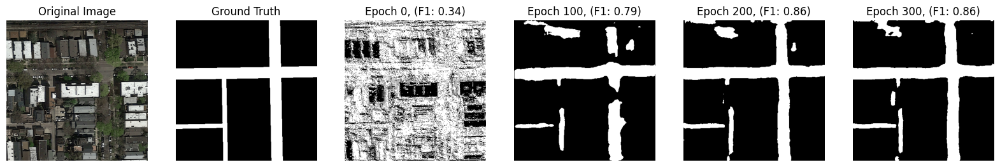

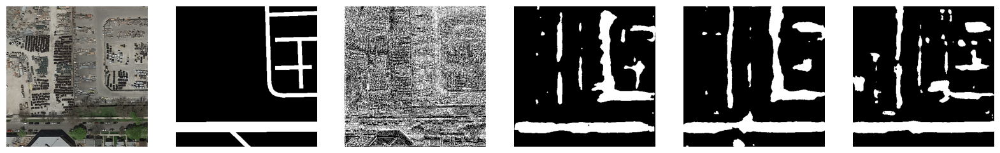

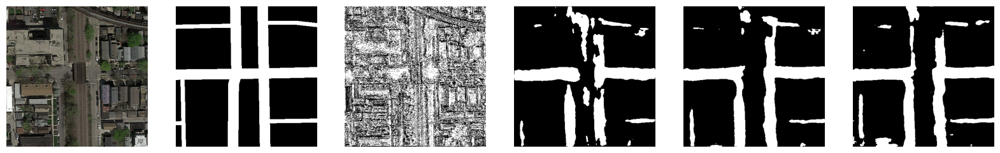

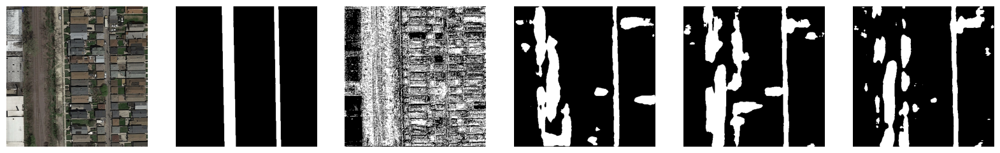

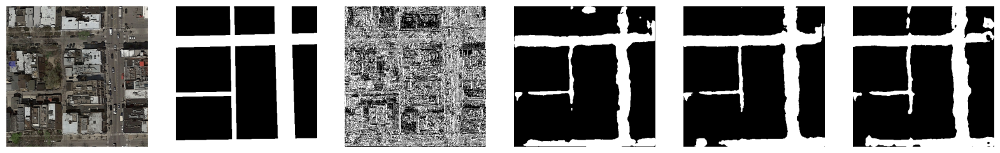

In [37]:
%matplotlib inline

def visualize(dataLoader, epochs, numImages=5):
    """
    Visualize predictions from models at specified epochs on a dataset.

    Args:
        dataLoader: DataLoader object for the dataset to visualize.
        epochs: List of epochs for which to load and visualize model predictions.
        numImages: Number of images to visualize from the DataLoader.
    """
    # Load models for the specified epochs
    models = [load_model(e)[0] for e in epochs]
    numModels = len(models)

    # Loop through the dataset to visualize a specific number of images
    for idx, (data, labels) in enumerate(dataLoader):
        if idx == numImages:  # Stop after visualizing the specified number of images
            break

        # Create subplots for original image, groundtruth, and predictions
        _, ax = plt.subplots(nrows=1, ncols=numModels + 2, figsize=(20, 15))

        # Unnormalize the input image for display
        unnormalized_data = data * torch.tensor(image_std).view(-1, 1, 1) + torch.tensor(image_mean).view(-1, 1, 1)

        # Display the original unnormalized image
        ax[0].imshow(unnormalized_data[0].permute(1, 2, 0).cpu().numpy())
        ax[0].axis('off')
        if idx == 0:
            ax[0].set_title('Original Image')

        # Display the ground truth mask
        ax[1].imshow(labels[0].cpu().numpy(), cmap='gray')
        ax[1].axis('off')
        if idx == 0:
            ax[1].set_title('Ground Truth')

        # Loop through the models and visualize their predictions
        for mIdx, model in enumerate(models):
            model = model.to(device)  # Move model to the device
            with torch.no_grad():  # Disable gradient computation during inference
                pred = model(data.to(device))  # Generate predictions from the model

                # Convert logits to binary predictions using sigmoid activation
                yhat = (torch.sigmoid(pred) > 0.5).float()

                # Compute f1-score
                f1 = f1_score(labels[0].cpu().numpy().flatten(), yhat[0,0,...].cpu().numpy().flatten())

                # Display the predicted mask
                ax[mIdx + 2].imshow(yhat[0, 0, ...].cpu().numpy(), cmap='gray')
                ax[mIdx + 2].axis('off')
                if idx == 0:
                    ax[mIdx + 2].set_title(f'Epoch {epochs[mIdx]}, (F1: {f1:.2f})')

# Visualize predictions for a number of epochs
dl_test_single = load_dataloader(data_root, 1, 'training', file_list=data_splits['test'])  # Load the test DataLoader, split set to training so it shuffles the images

# Define the epochs for which to visualize model predictions
epochs = [0, 100, 200, 300]  # Modify as needed based on available model checkpoints

# Call the visualize function to display predictions
visualize(dl_test_single, epochs, numImages=5)

## 5. Predictions and Submissions
This part allow us to visualize our predictions on the test images and create submissions for AIcrowd.

In [38]:
class TestDataset(dataset.Dataset):
    '''
        Custom Dataset class that loads images and groundtruth segmentation
        masks from a directory (necessary to load the files from the test folder and create submission).
    '''

    LABEL_CLASSES = ('No Road', 'Road')

    def __init__(self, path):
        '''
            Dataset class constructor.
        '''
        super().__init__()

        self.path = path
        self.data = [f for f in os.listdir(self.path) if f.endswith('.png')]


    def __len__(self):
        '''Number of samples.'''
        return len(self.data)

    def __getitem__(self, idx):
        '''
        Loads and prepares images and labels.
        '''
        item = self.data[idx]

        # Load image
        image_path = os.path.join(self.path, item)
        image = Image.open(image_path)


        # Default processing
        image = to_tensor(image)
        image = normalize(image, image_mean, image_std)

        return image

### 5.1 Visualization of all 50 predicitons on the test images  
CNN state can be set to the epoch of choice. This allow us to visually compare de performance of our model between training epochs.

<ipython-input-67-e4c99ae98723>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


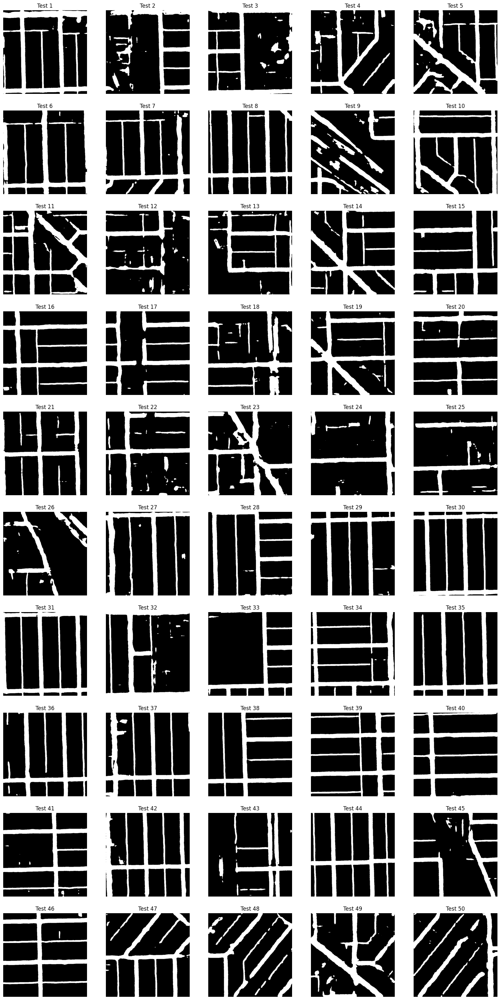

In [67]:
# Path where the test folder is stored. Replace with your own path if necessary
test_path = os.path.join(data_root, 'test_set_images')

# Load the desired model state
epoch_to_load = 219  # Specify the epoch you want to load
model_path = f'{data_root}/cnn_states/UNet/{epoch_to_load}.pth'  # Path to the saved model
model.load_state_dict(torch.load(model_path))

model.eval()  # Set the model to evaluation mode

preds = []
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(20, 40))  # Increased figsize
axs = axs.flatten()  # Flatten to a 1D array for easier indexing

for i in range(1,51):
  # Corrected data_root for test images
  test_dataset = TestDataset(os.path.join(test_path, f'test_{i}'))
  data = test_dataset.__getitem__(0)

  # Add a batch dimension to the input data
  data = data.unsqueeze(0).to(device)

  with torch.no_grad():
    pred = model(data)
    yhat = (torch.sigmoid(pred) > 0.5).float()
    preds.append(yhat.permute(0,2,3,1).detach().cpu().numpy())
    axs[i-1].imshow(yhat[0,0,...].cpu().numpy(), cmap='gray')
    axs[i-1].axis('off')  # Turn off axis coordinates
    axs[i-1].set_title(f'Test {i}')

plt.show()

preds = np.concatenate(preds,axis=0)

In [68]:
def stitch_patches(patches, patches_per_column):
    """
    Stitch patches into a single image where each column contains a specified number of patches.

    Parameters:
        patches: numpy array
            Array of patches with shape (num_patches, patch_height, patch_width, channels).
        patches_per_column: int
            Number of patches to place in each column.

    Returns:
        numpy array
            Stitched image of shape (total_height, total_width, channels).
    """
    num_patches, patch_height, patch_width, channels = patches.shape
    patches_per_row = int(num_patches / patches_per_column)

    if num_patches % patches_per_column != 0:
        raise ValueError("Number of patches must be divisible by patches_per_column.")

    # Convert dimensions to integers
    patches_per_row = int(patches_per_row)
    total_height = int(patches_per_column * patch_height)
    total_width = int(patches_per_row * patch_width)

    # Initialize the stitched image
    stitched_image = np.zeros((total_height, total_width, channels), dtype=patches.dtype)

    # Place each patch into the stitched image
    patch_idx = 0
    for col in range(patches_per_row):
        for row in range(patches_per_column):
            y_start = row * patch_height
            y_end = y_start + patch_height
            x_start = col * patch_width
            x_end = x_start + patch_width

            # Place the patch correctly
            stitched_image[y_start:y_end, x_start:x_end, :] = patches[patch_idx]
            patch_idx += 1

    return stitched_image

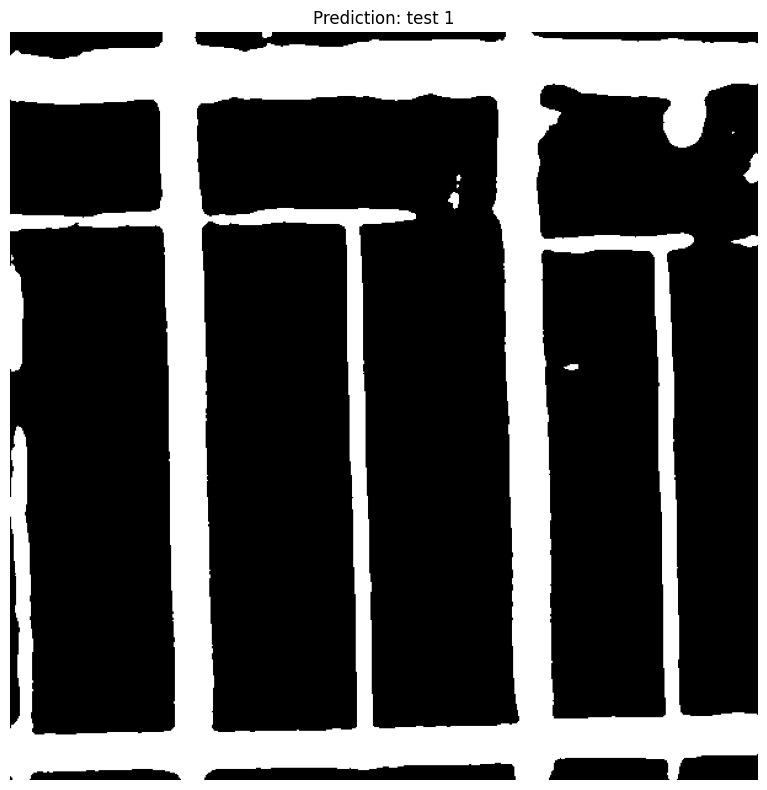

Saved plot 1 to Unet_prediction/test_1.png.


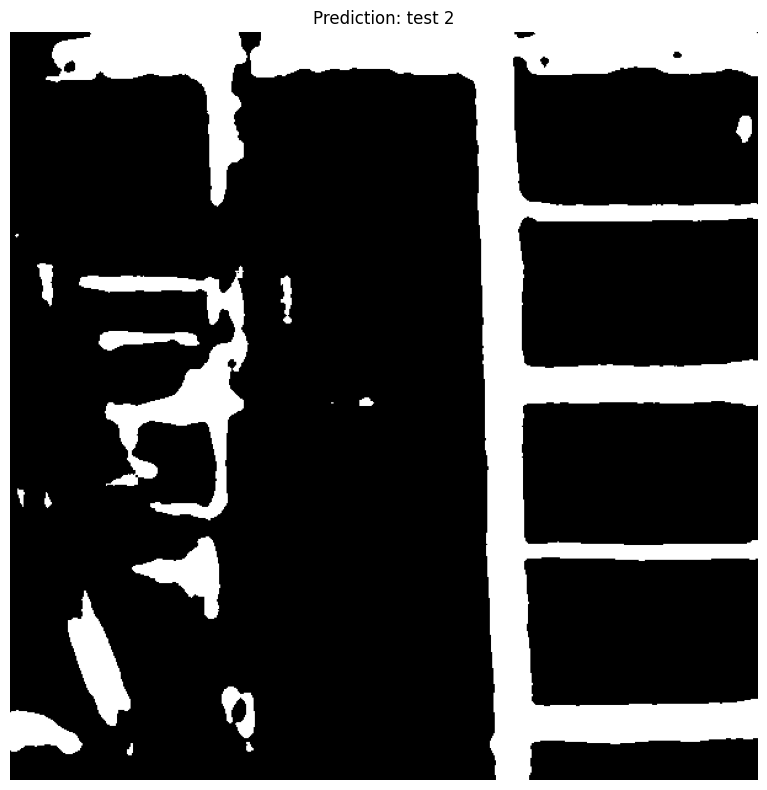

Saved plot 2 to Unet_prediction/test_2.png.


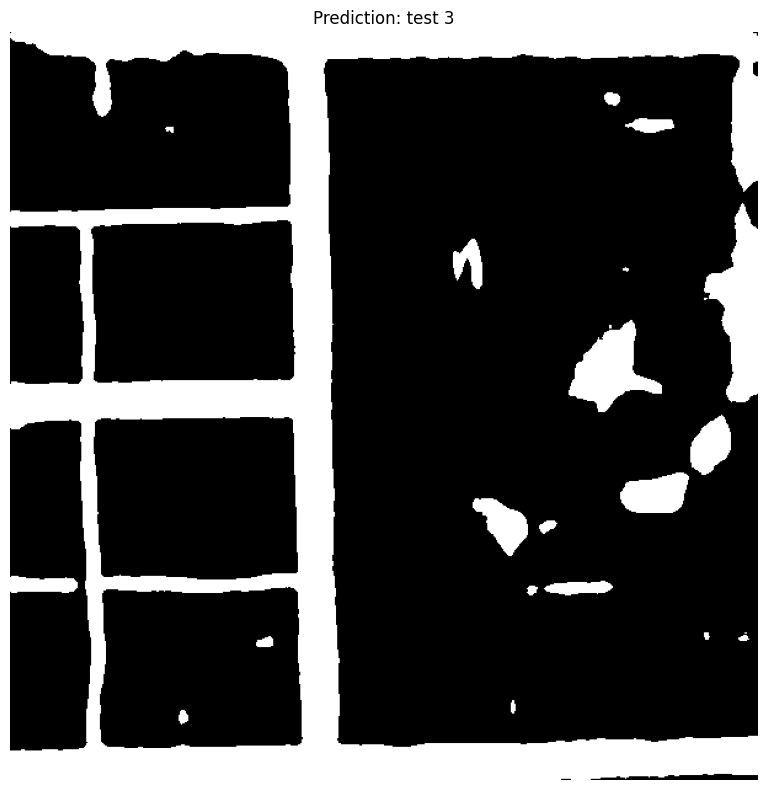

Saved plot 3 to Unet_prediction/test_3.png.


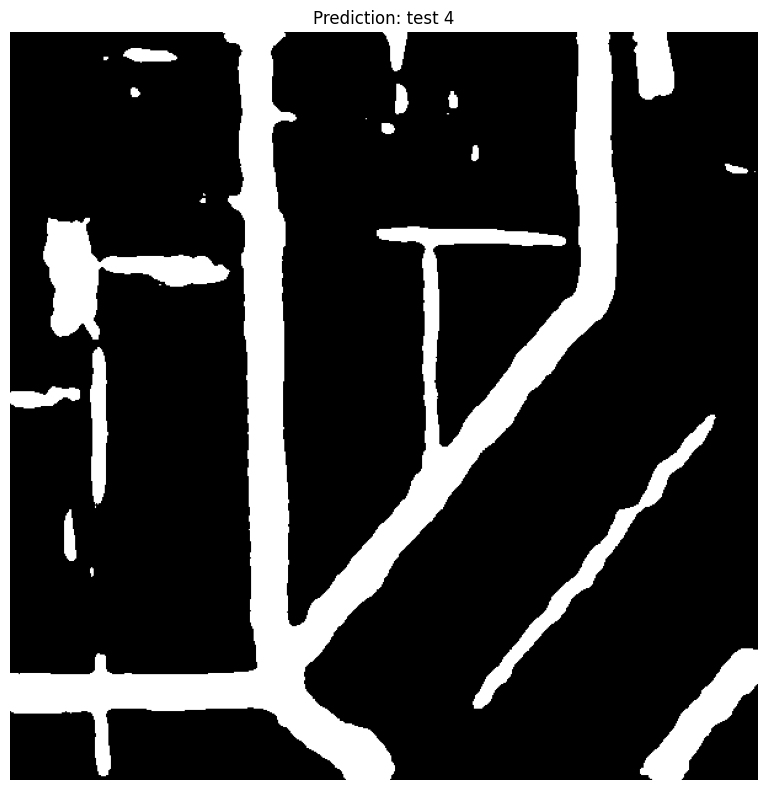

Saved plot 4 to Unet_prediction/test_4.png.


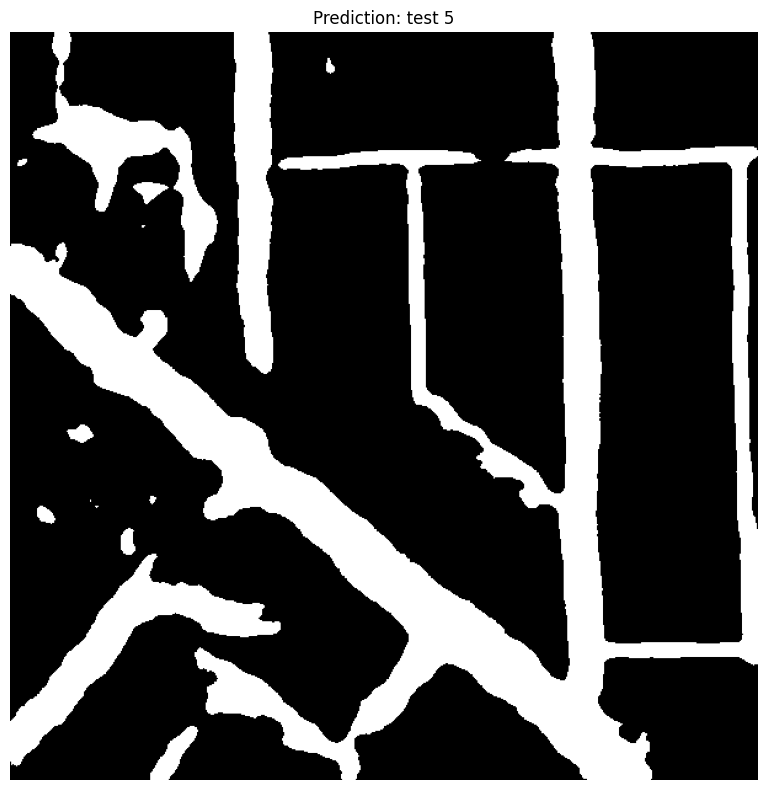

Saved plot 5 to Unet_prediction/test_5.png.


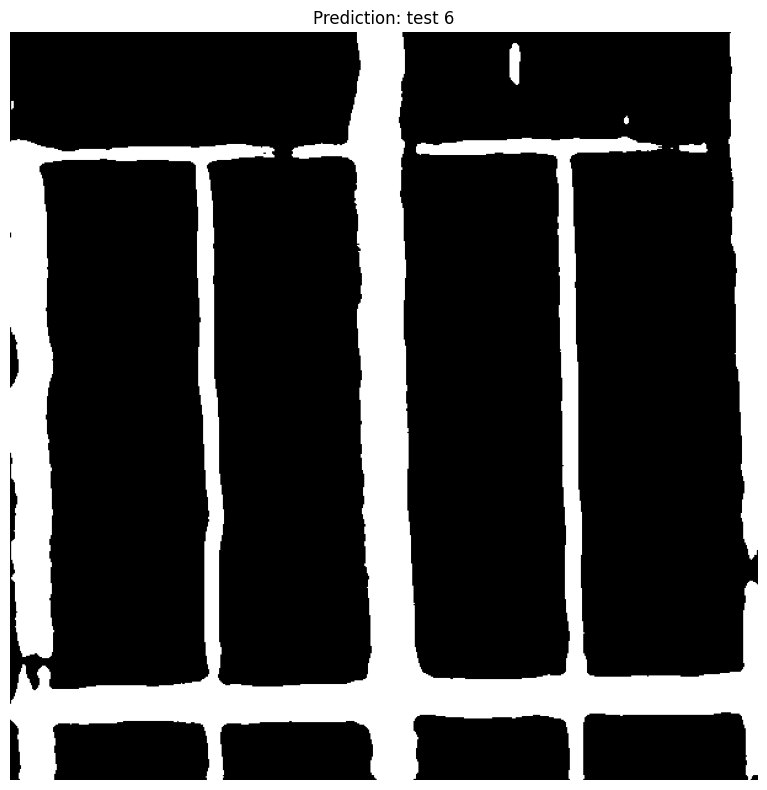

Saved plot 6 to Unet_prediction/test_6.png.


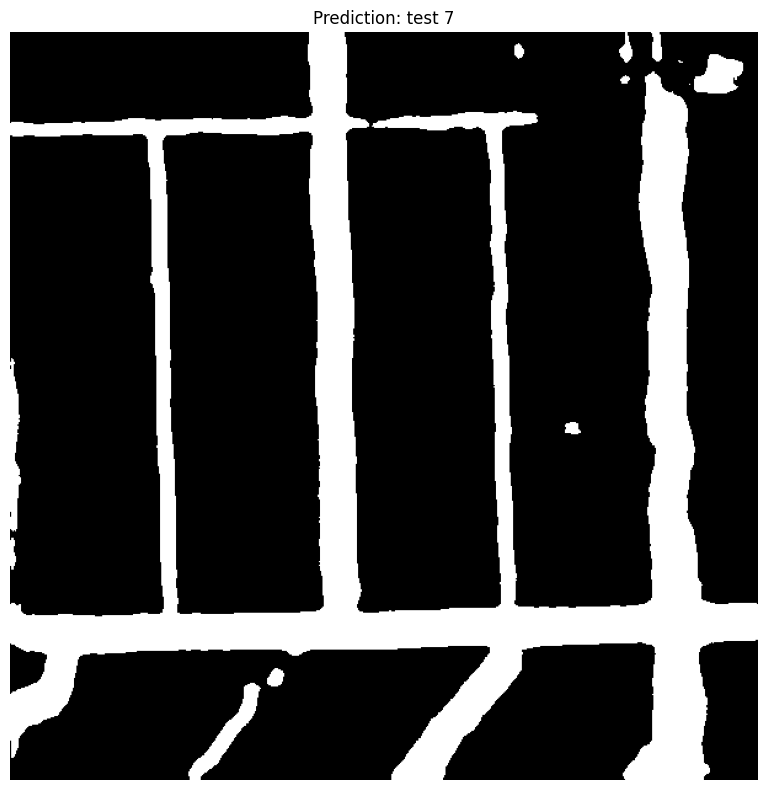

Saved plot 7 to Unet_prediction/test_7.png.


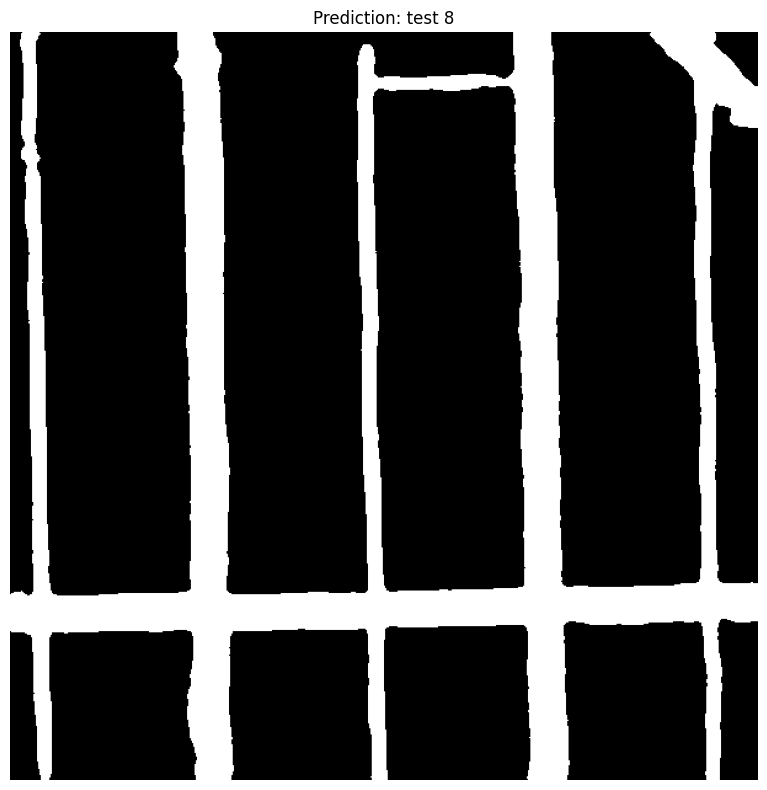

Saved plot 8 to Unet_prediction/test_8.png.


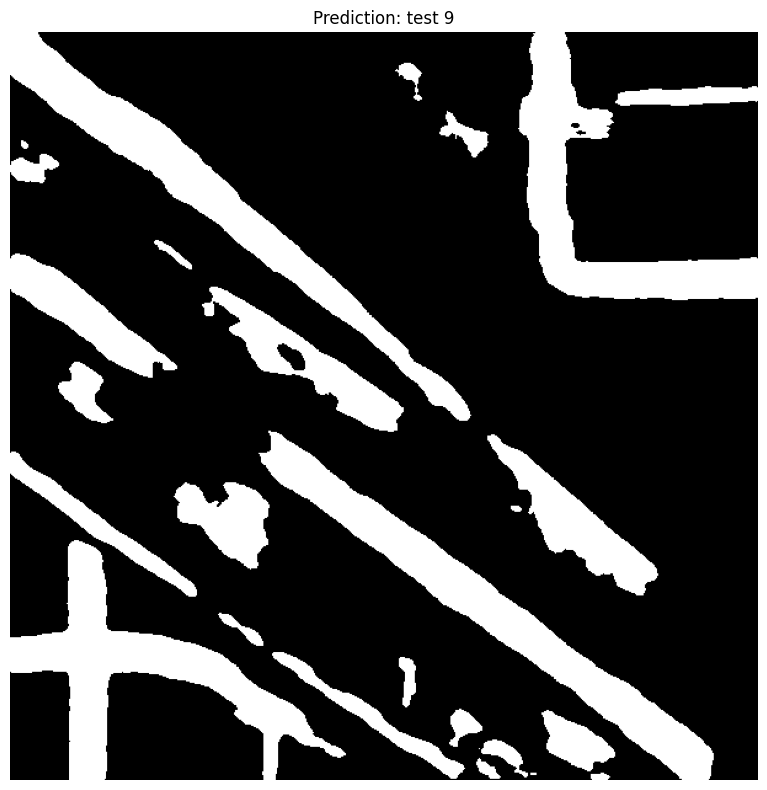

Saved plot 9 to Unet_prediction/test_9.png.


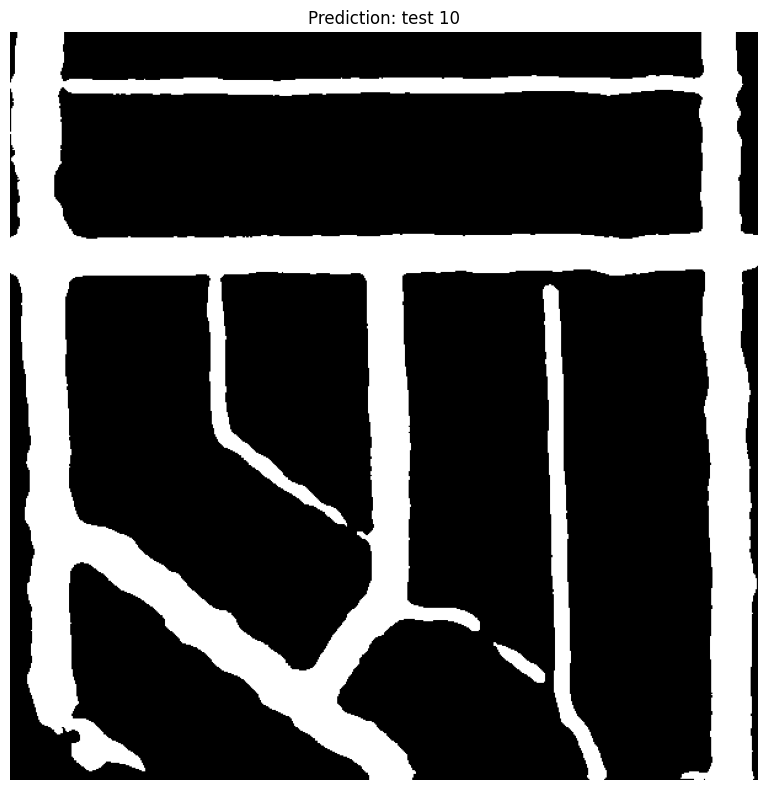

Saved plot 10 to Unet_prediction/test_10.png.


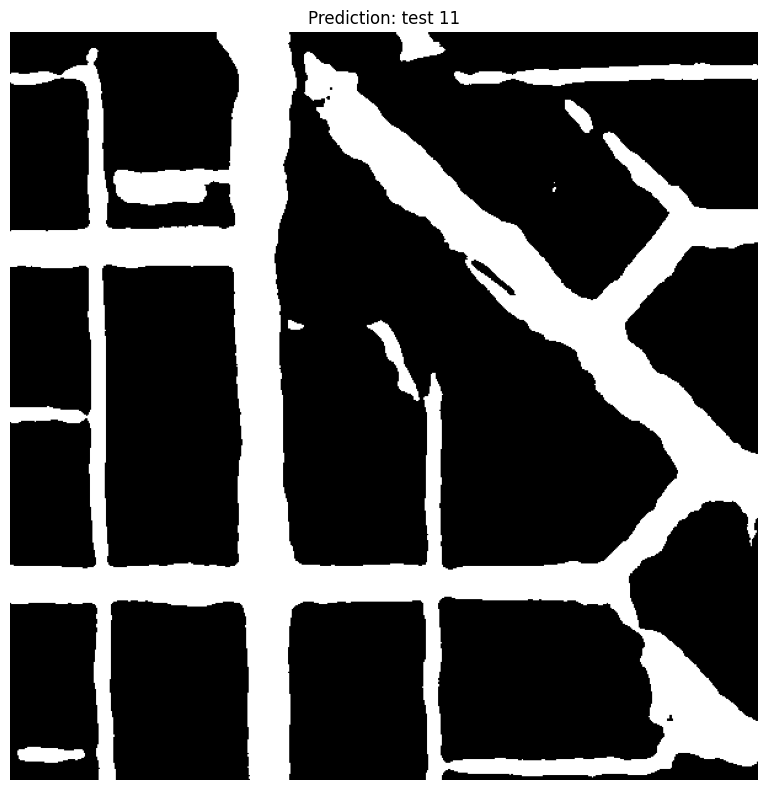

Saved plot 11 to Unet_prediction/test_11.png.


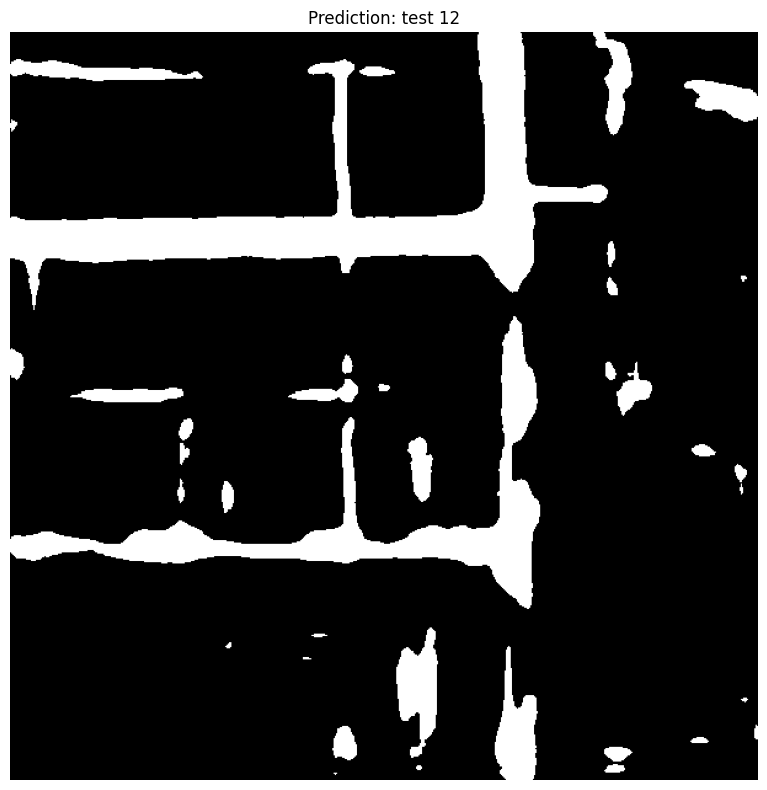

Saved plot 12 to Unet_prediction/test_12.png.


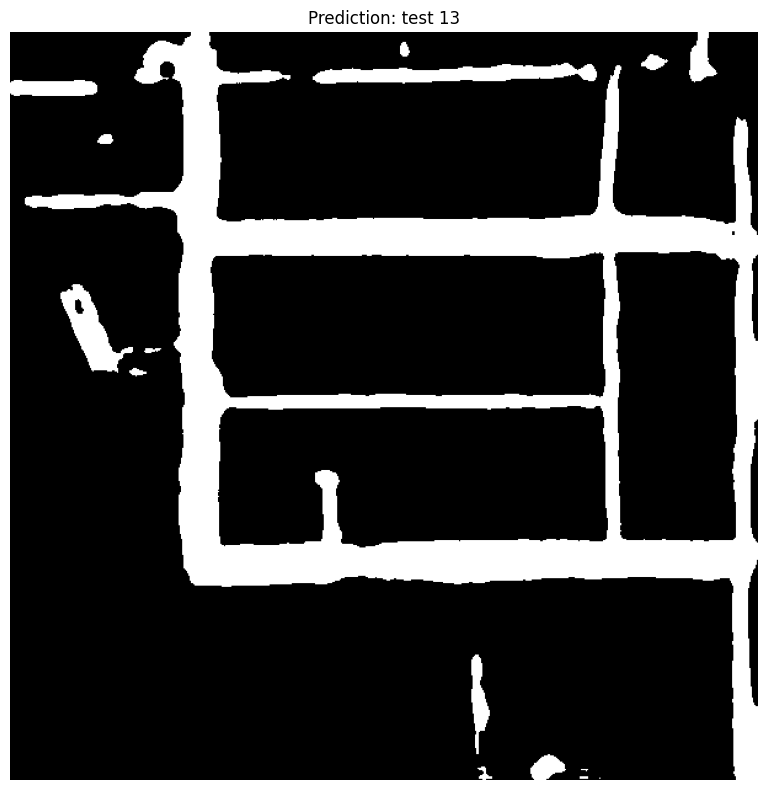

Saved plot 13 to Unet_prediction/test_13.png.


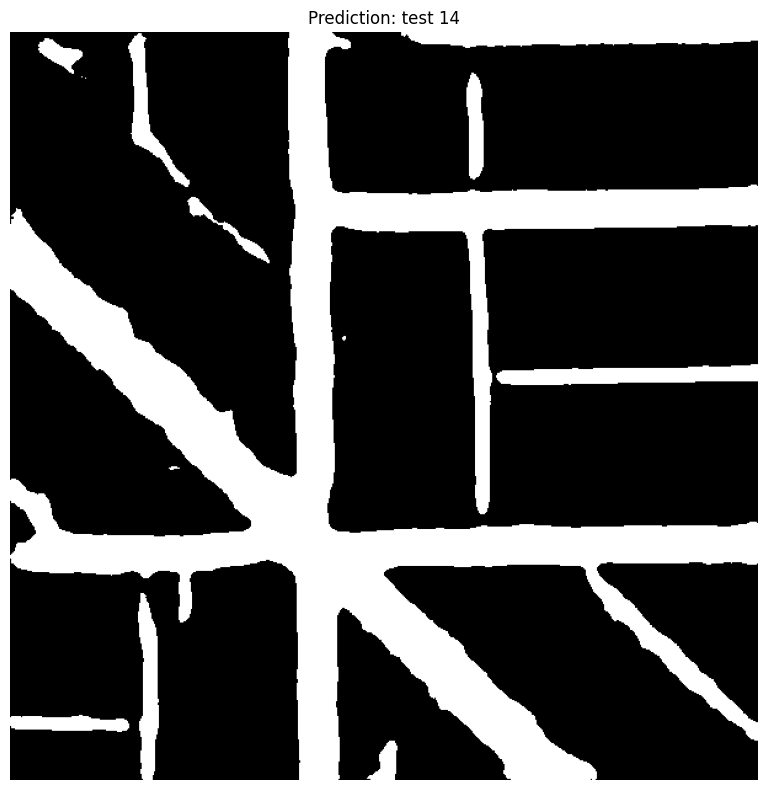

Saved plot 14 to Unet_prediction/test_14.png.


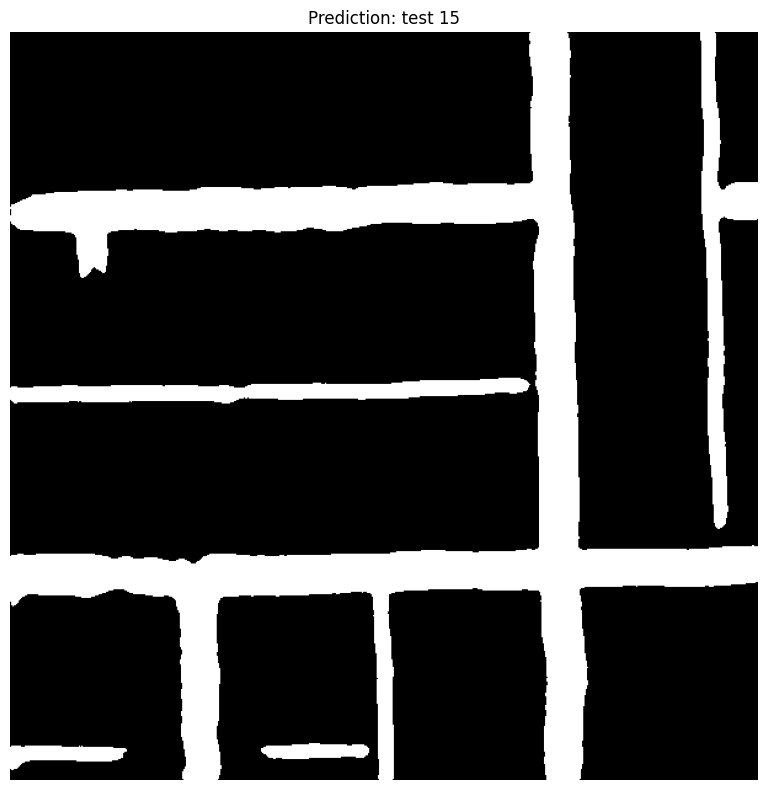

Saved plot 15 to Unet_prediction/test_15.png.


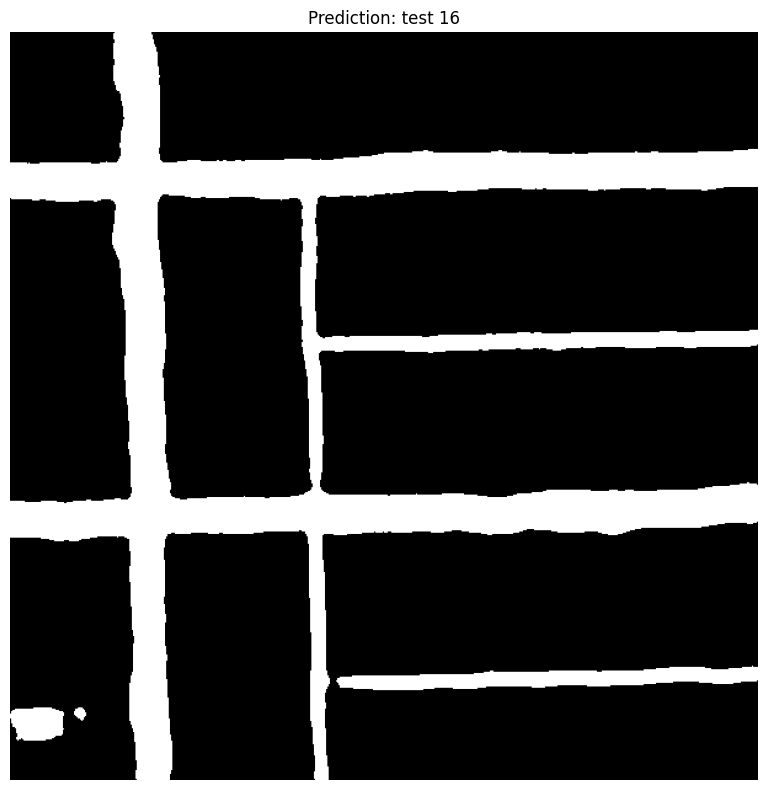

Saved plot 16 to Unet_prediction/test_16.png.


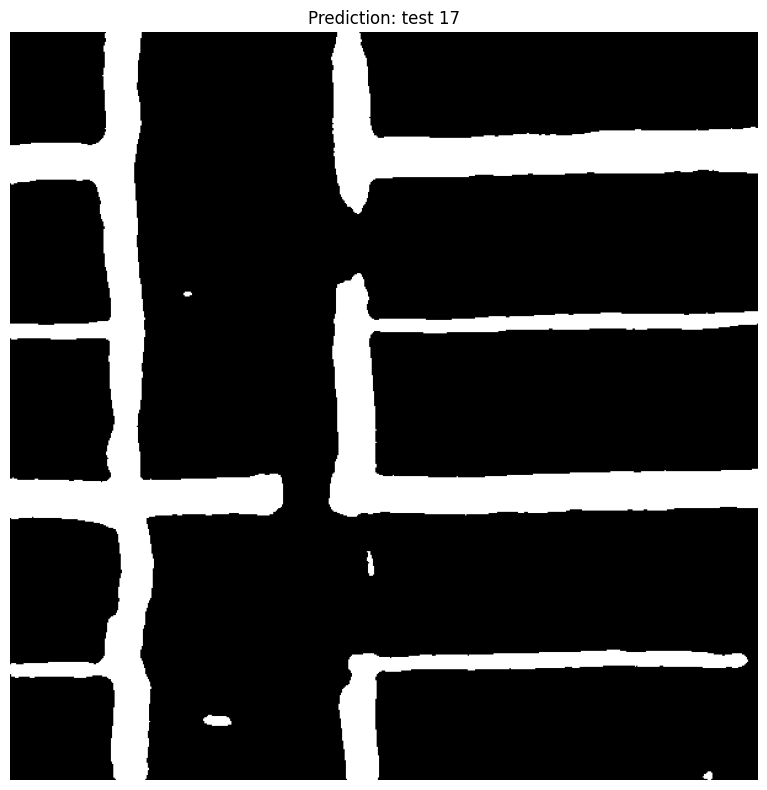

Saved plot 17 to Unet_prediction/test_17.png.


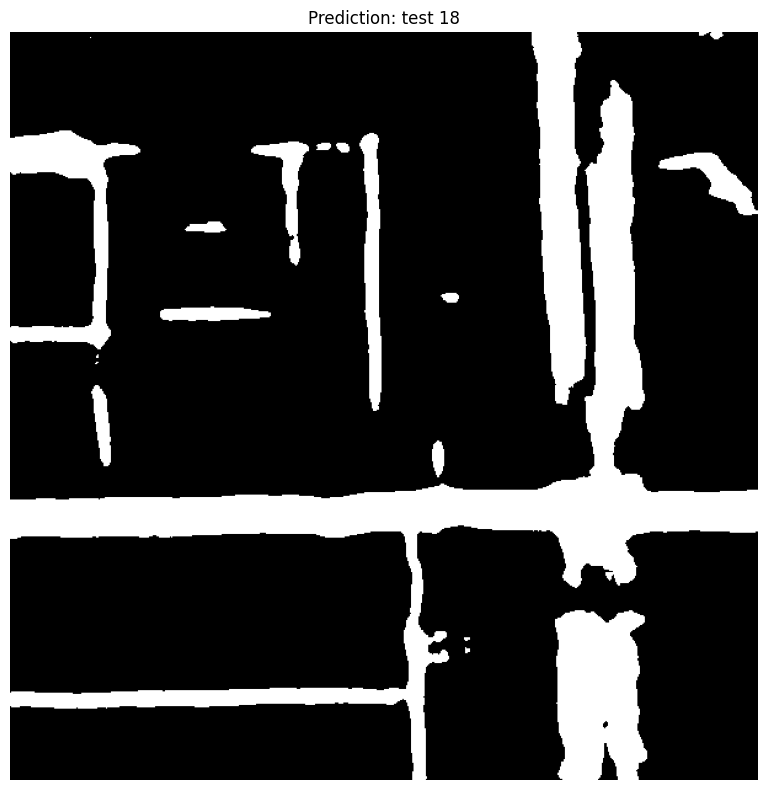

Saved plot 18 to Unet_prediction/test_18.png.


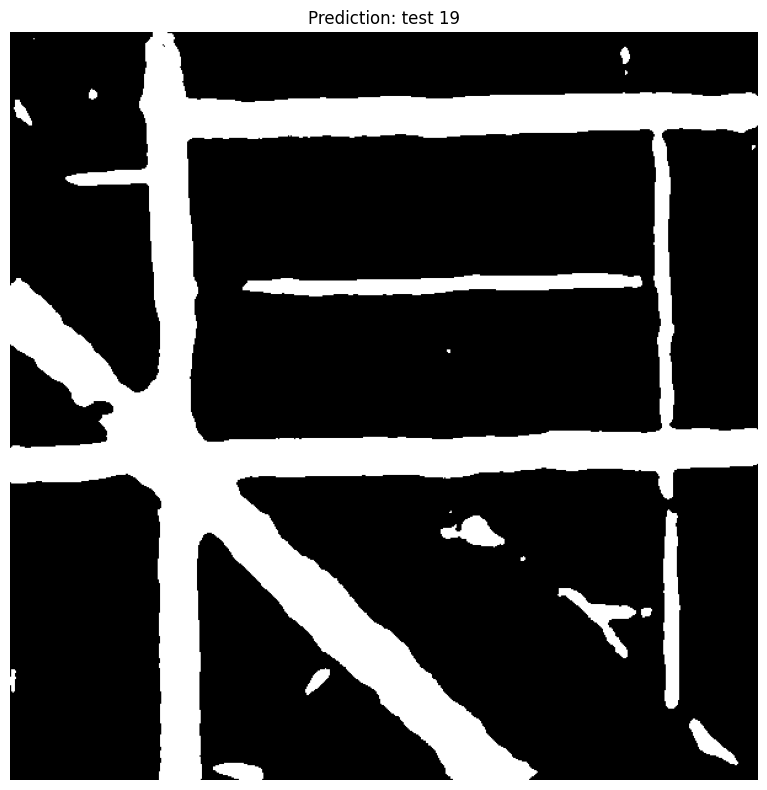

Saved plot 19 to Unet_prediction/test_19.png.


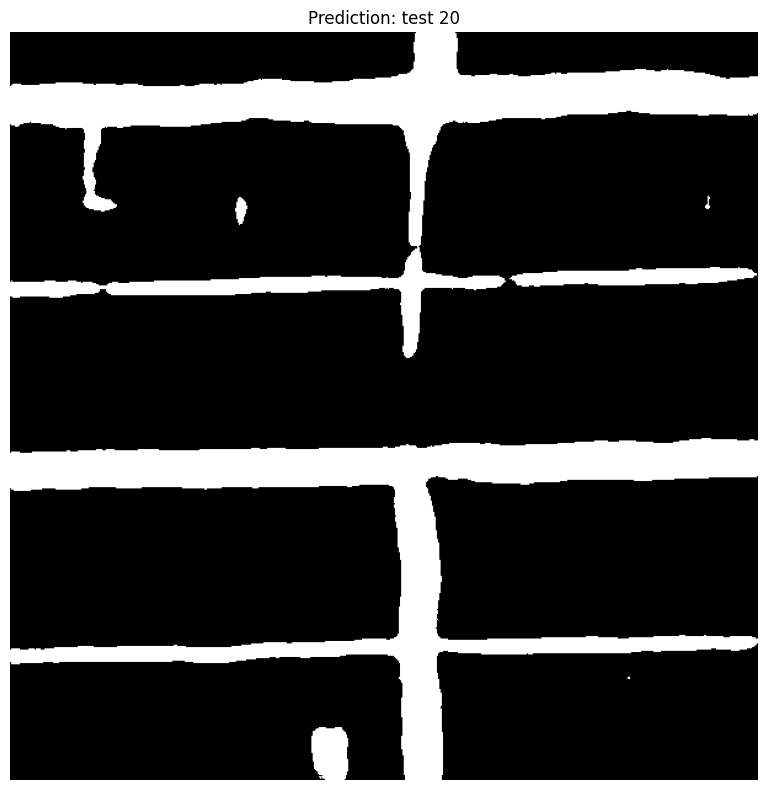

Saved plot 20 to Unet_prediction/test_20.png.


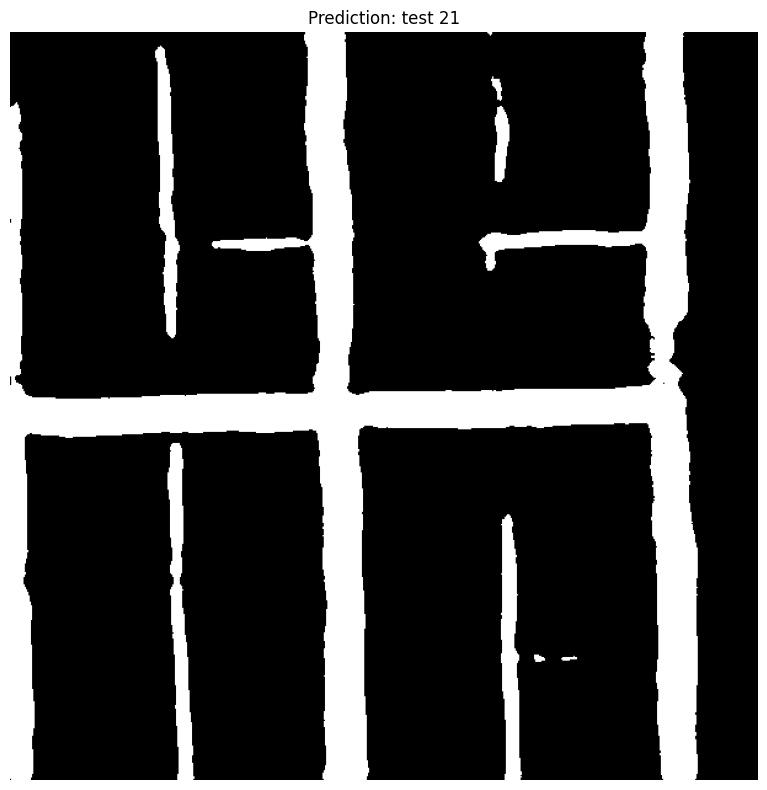

Saved plot 21 to Unet_prediction/test_21.png.


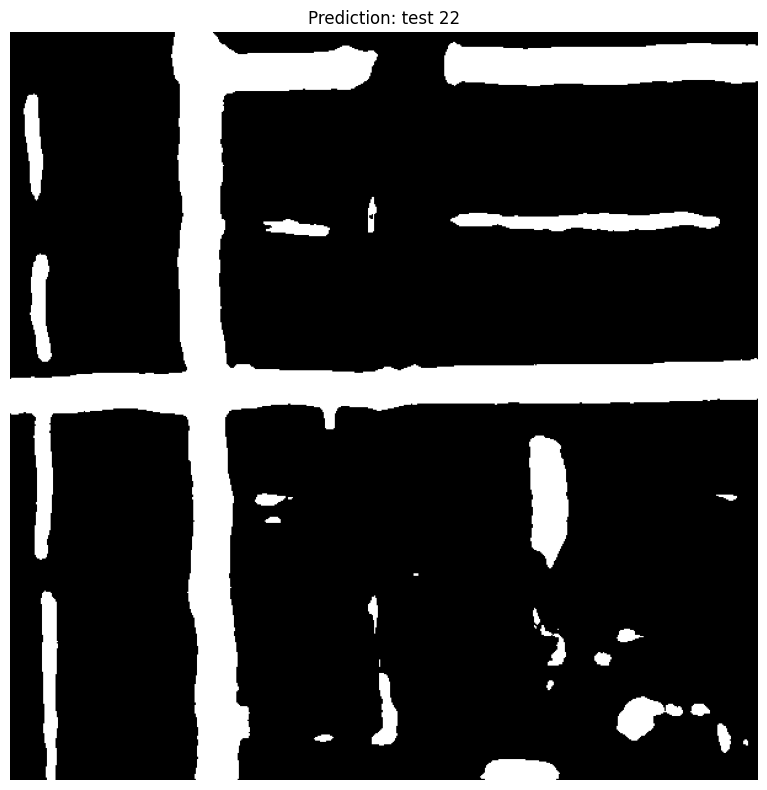

Saved plot 22 to Unet_prediction/test_22.png.


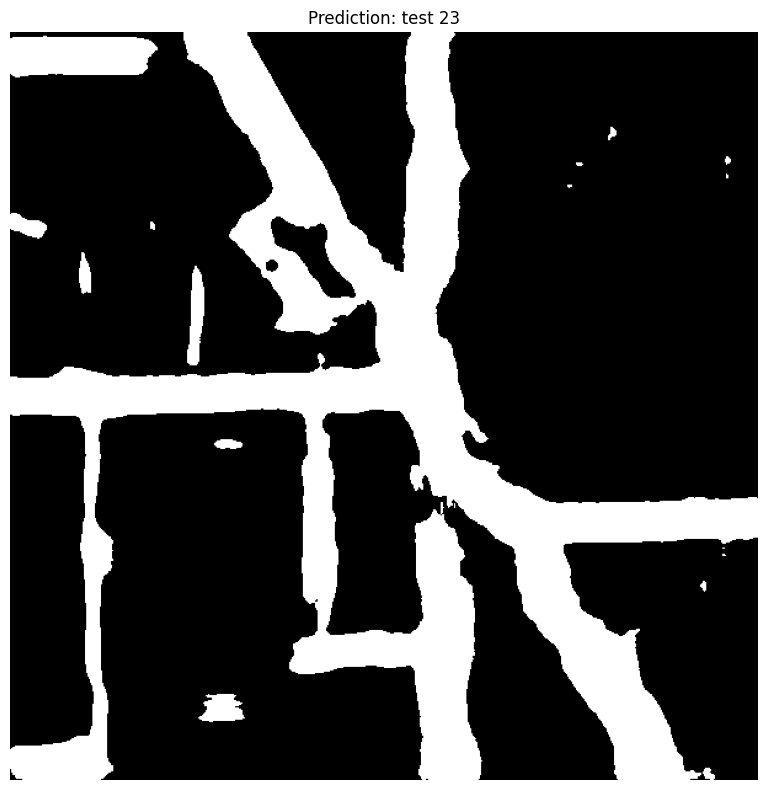

Saved plot 23 to Unet_prediction/test_23.png.


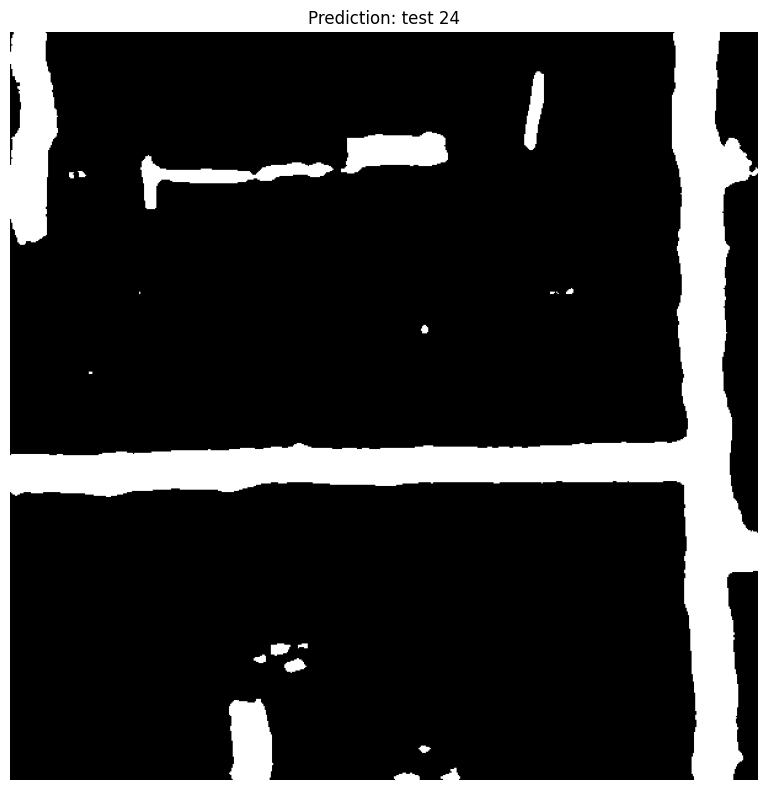

Saved plot 24 to Unet_prediction/test_24.png.


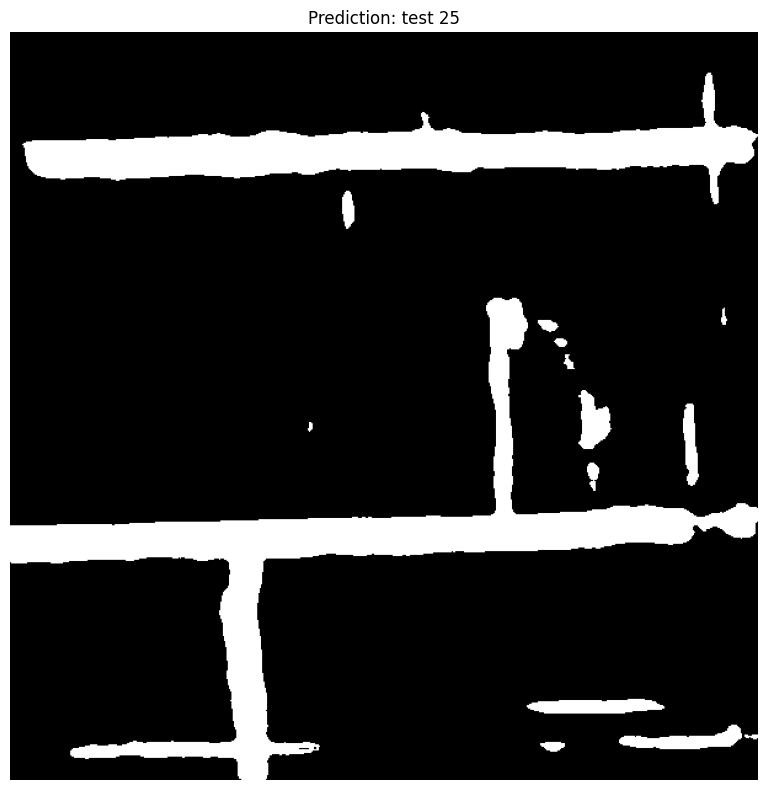

Saved plot 25 to Unet_prediction/test_25.png.


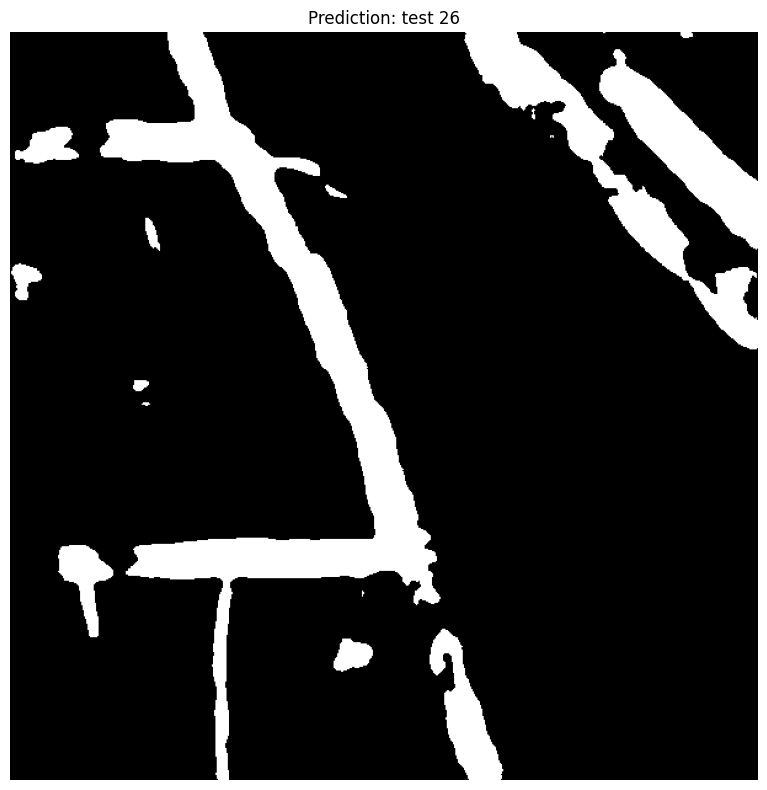

Saved plot 26 to Unet_prediction/test_26.png.


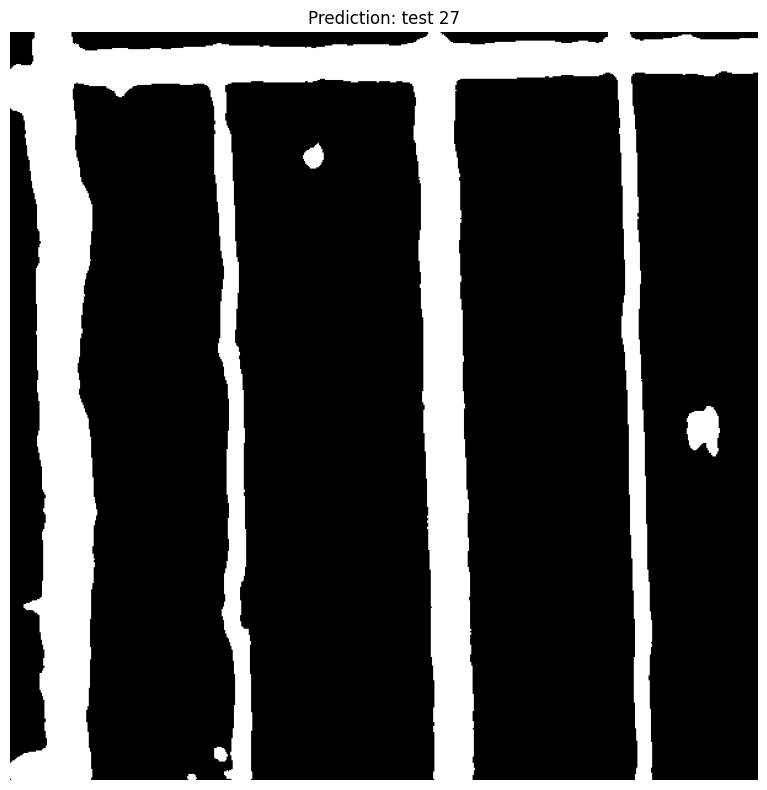

Saved plot 27 to Unet_prediction/test_27.png.


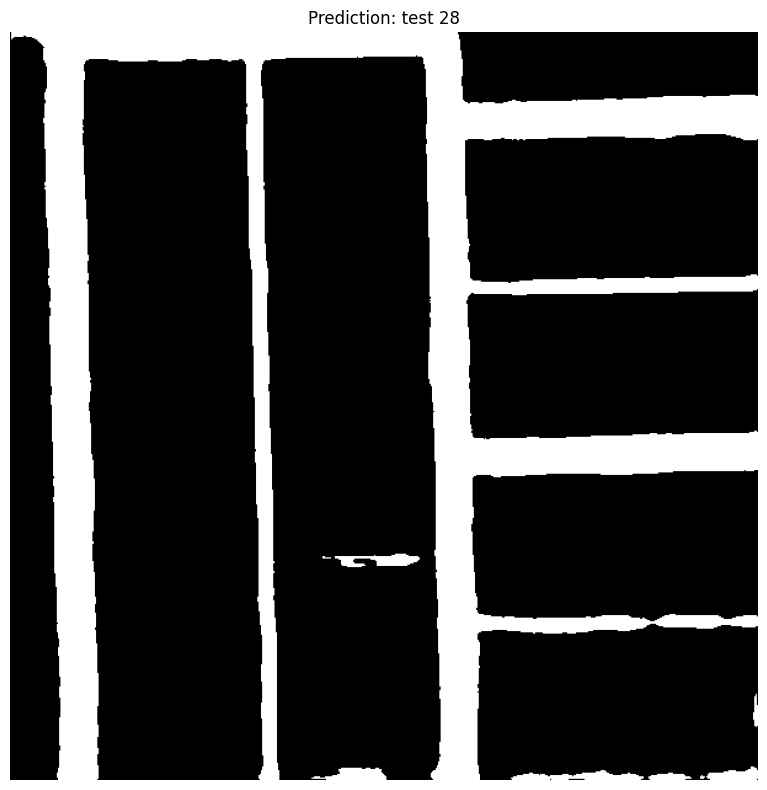

Saved plot 28 to Unet_prediction/test_28.png.


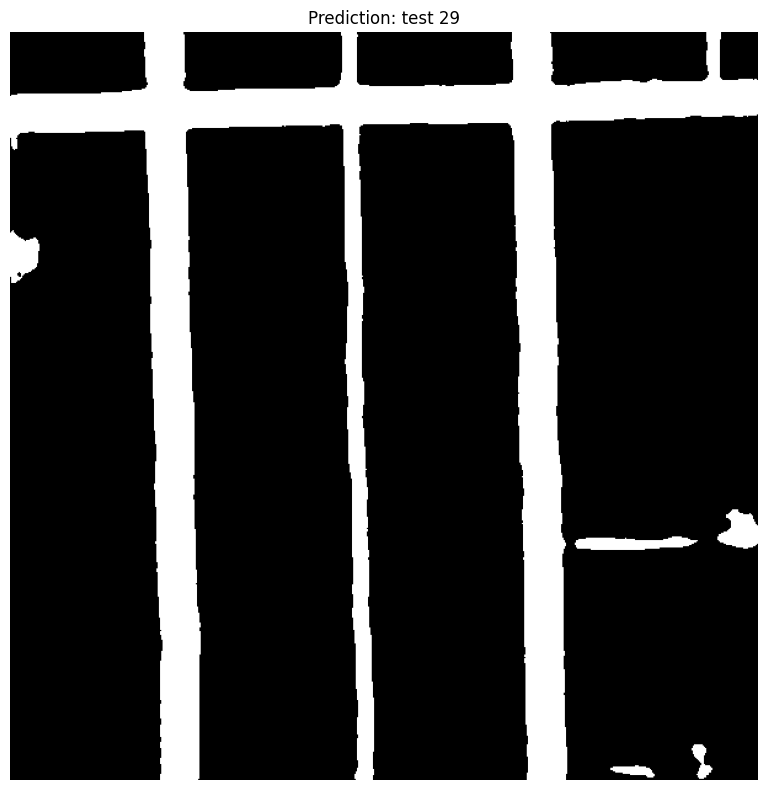

Saved plot 29 to Unet_prediction/test_29.png.


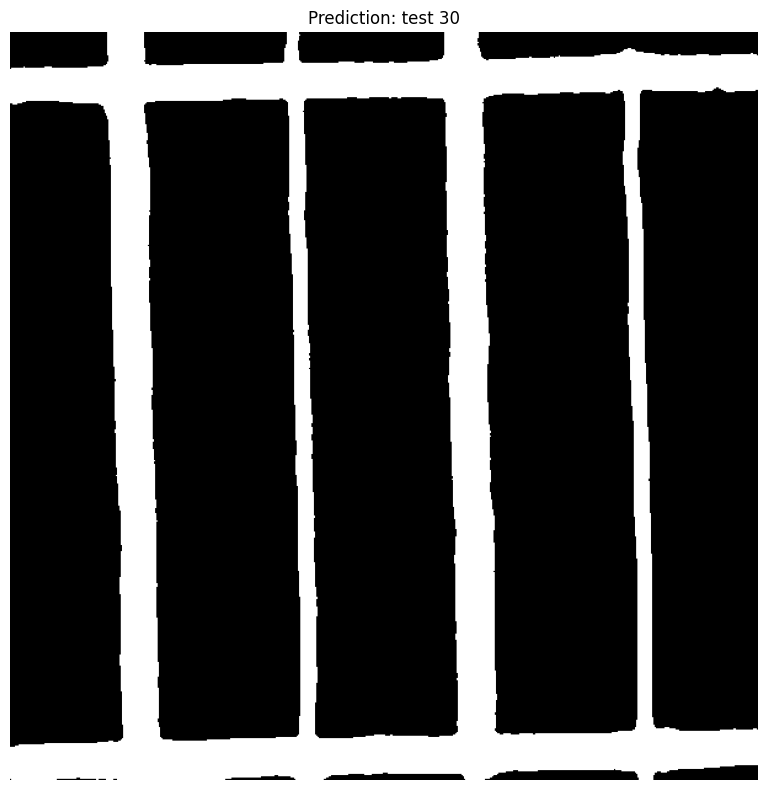

Saved plot 30 to Unet_prediction/test_30.png.


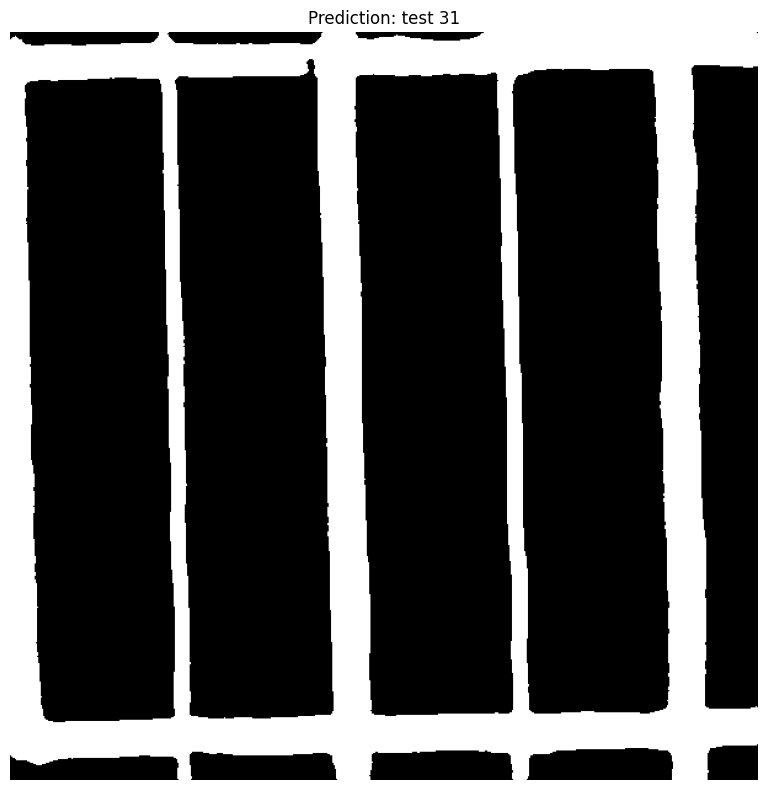

Saved plot 31 to Unet_prediction/test_31.png.


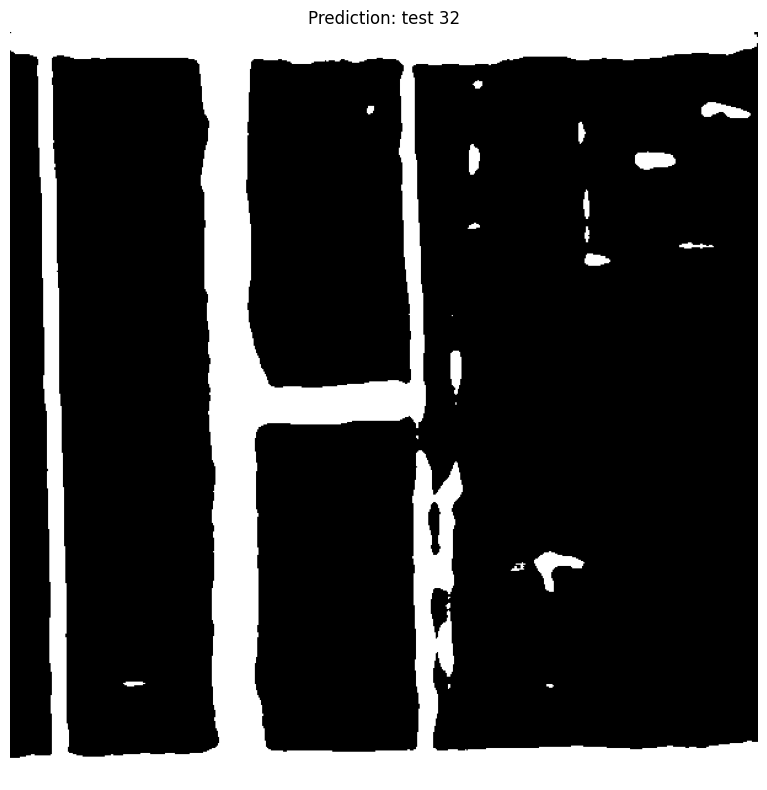

Saved plot 32 to Unet_prediction/test_32.png.


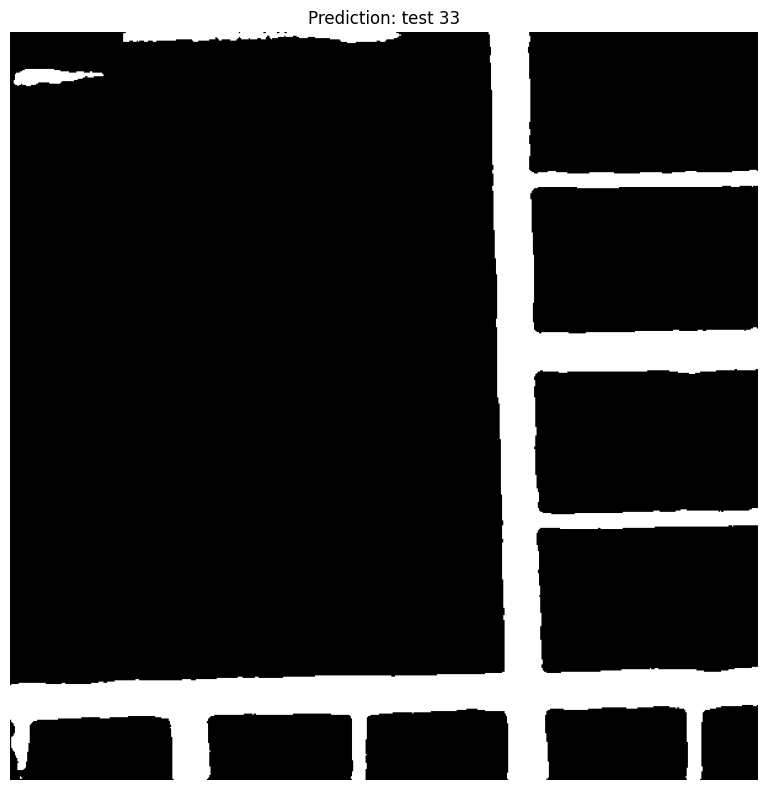

Saved plot 33 to Unet_prediction/test_33.png.


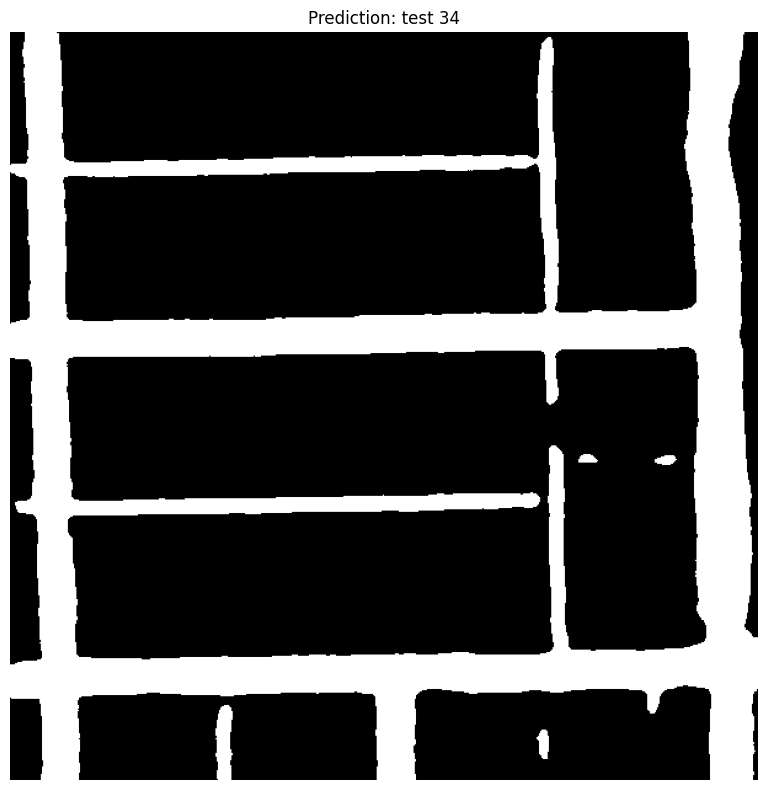

Saved plot 34 to Unet_prediction/test_34.png.


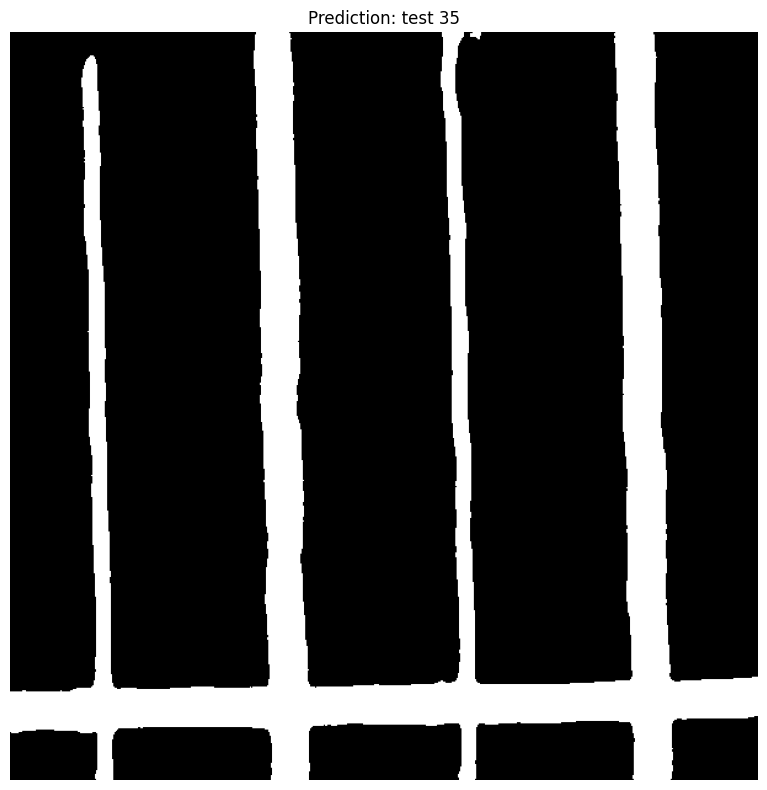

Saved plot 35 to Unet_prediction/test_35.png.


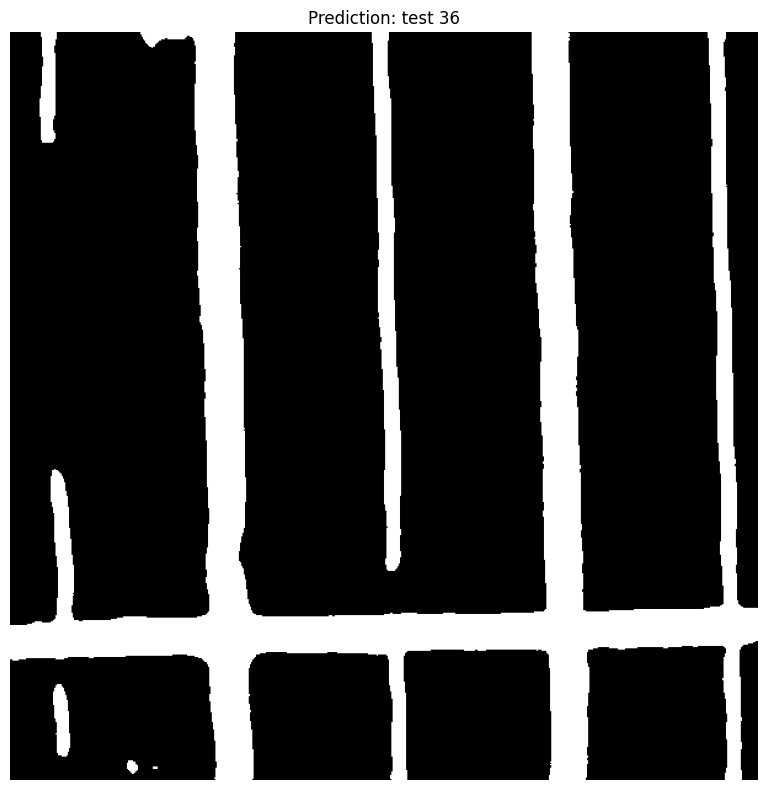

Saved plot 36 to Unet_prediction/test_36.png.


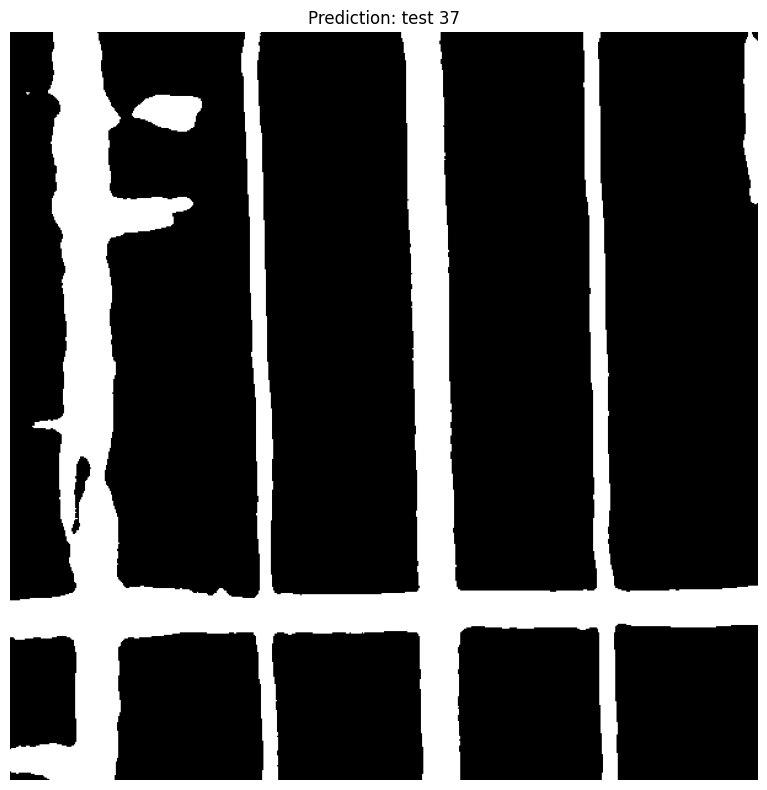

Saved plot 37 to Unet_prediction/test_37.png.


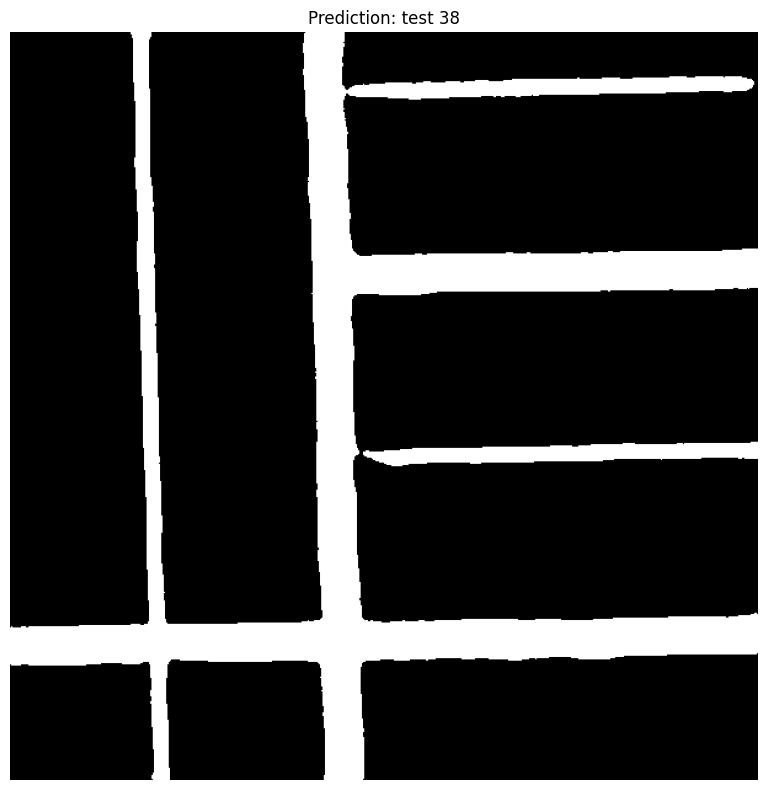

Saved plot 38 to Unet_prediction/test_38.png.


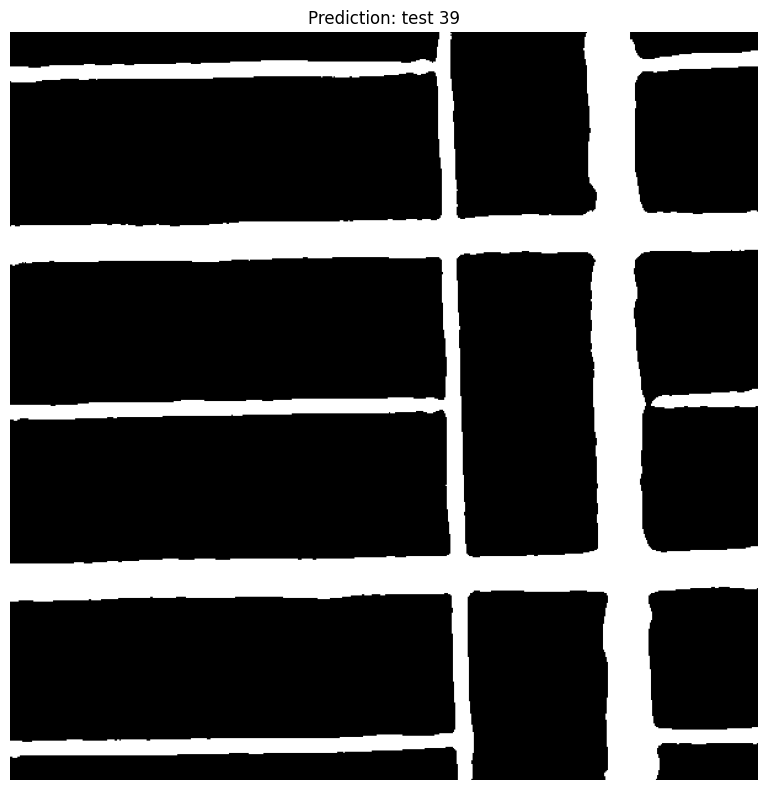

Saved plot 39 to Unet_prediction/test_39.png.


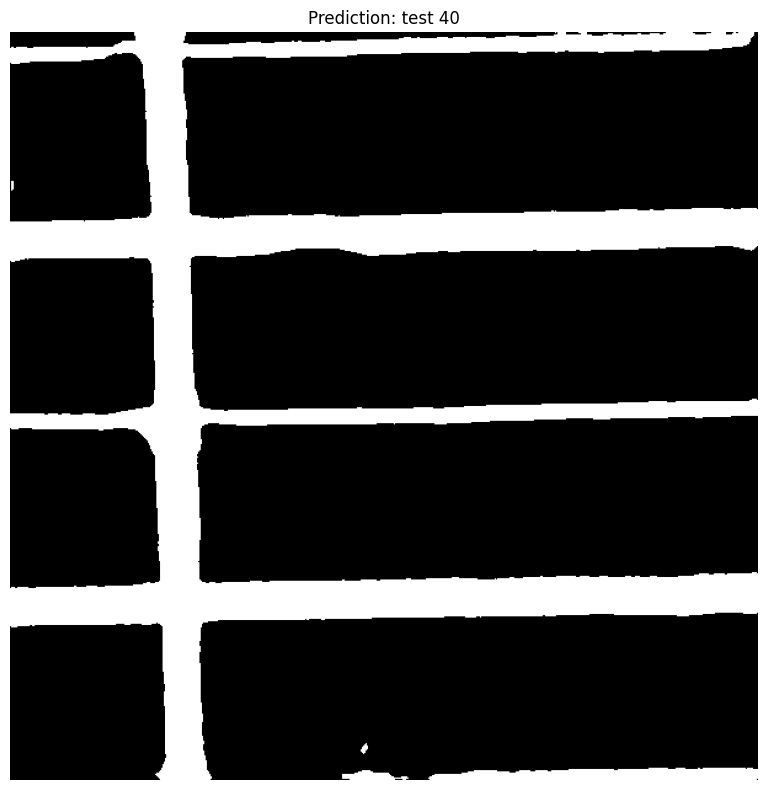

Saved plot 40 to Unet_prediction/test_40.png.


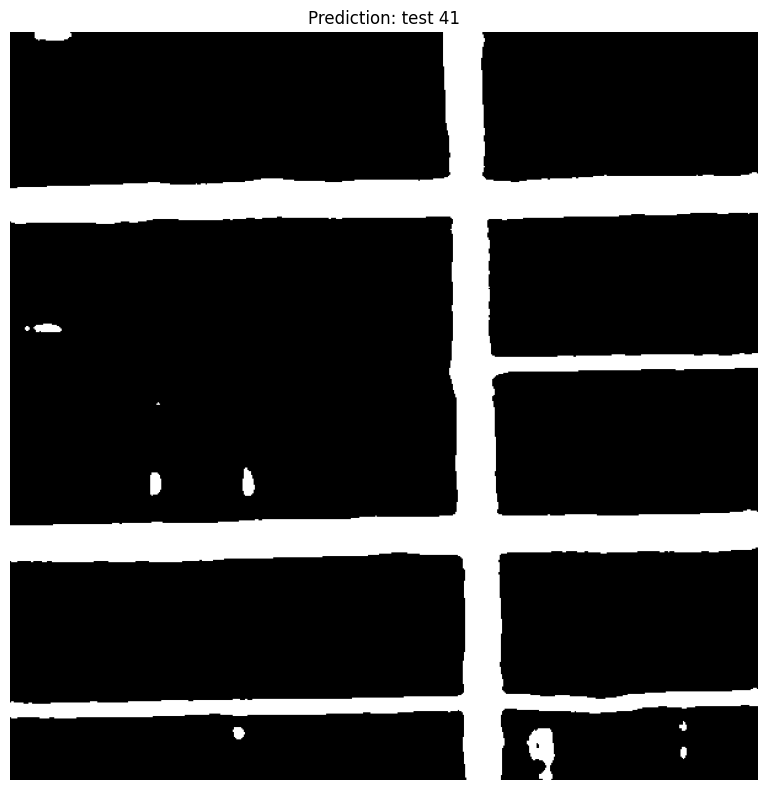

Saved plot 41 to Unet_prediction/test_41.png.


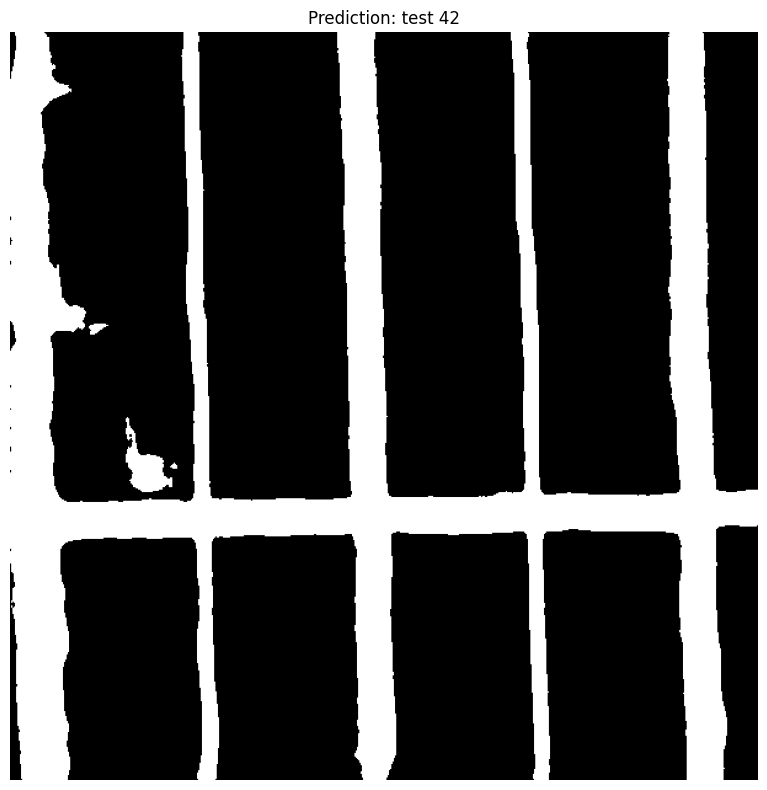

Saved plot 42 to Unet_prediction/test_42.png.


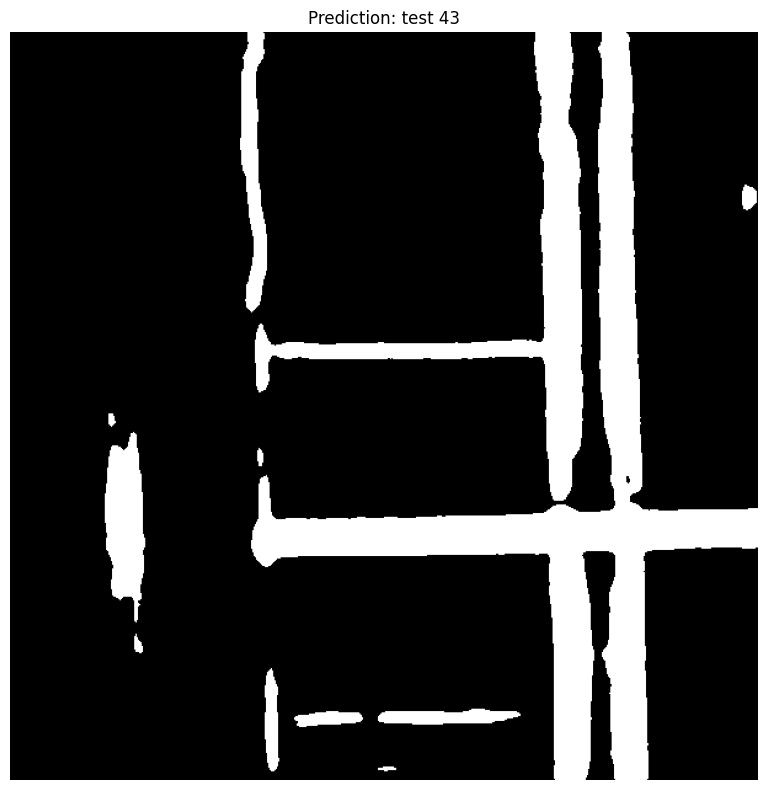

Saved plot 43 to Unet_prediction/test_43.png.


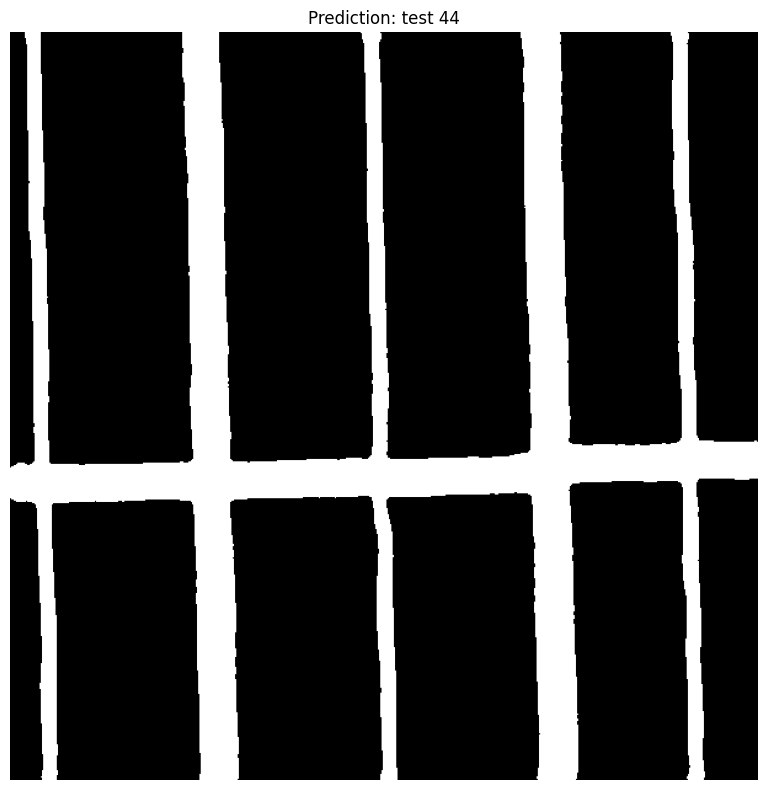

Saved plot 44 to Unet_prediction/test_44.png.


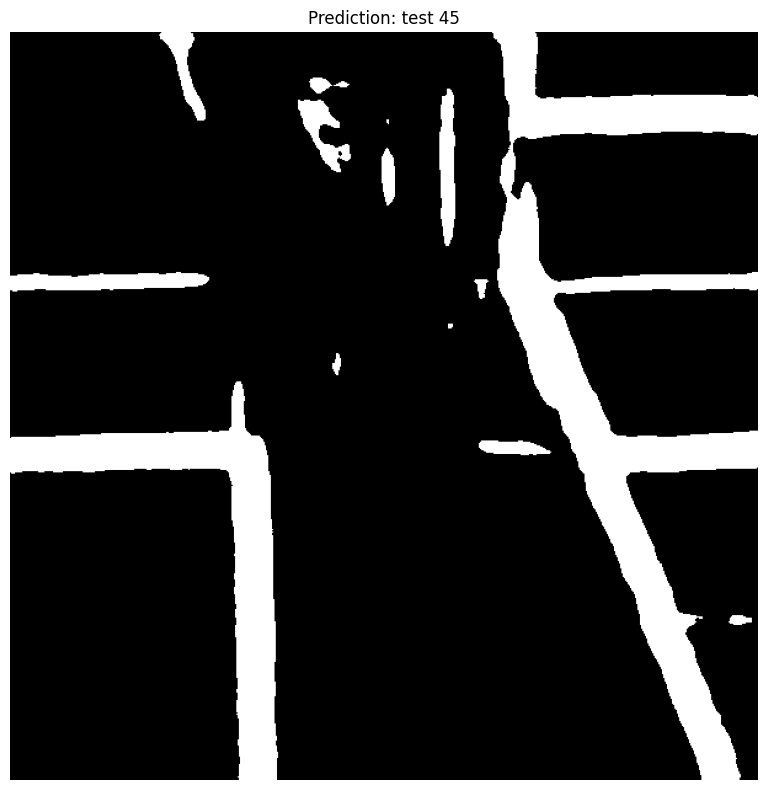

Saved plot 45 to Unet_prediction/test_45.png.


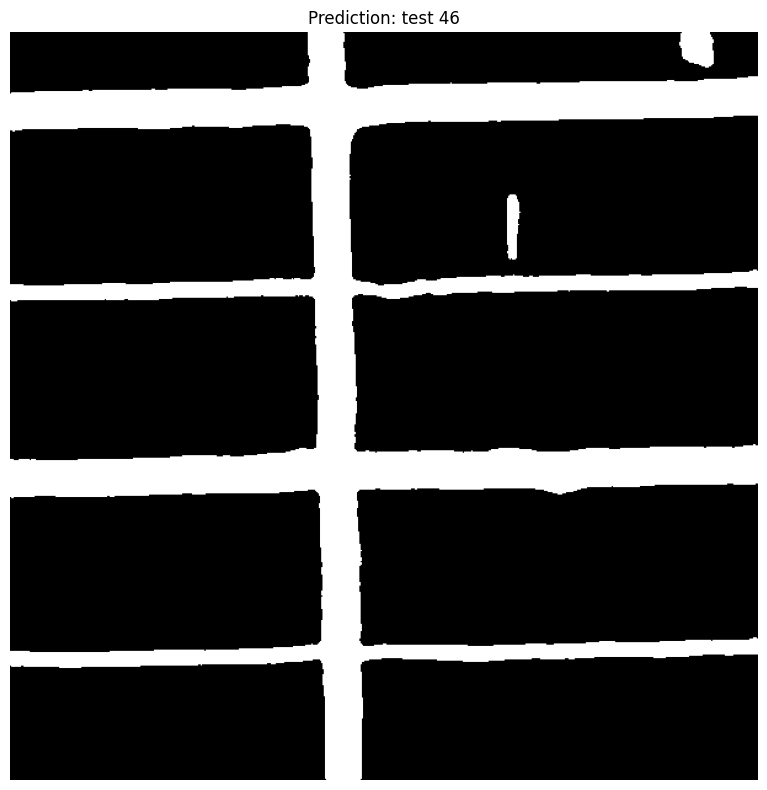

Saved plot 46 to Unet_prediction/test_46.png.


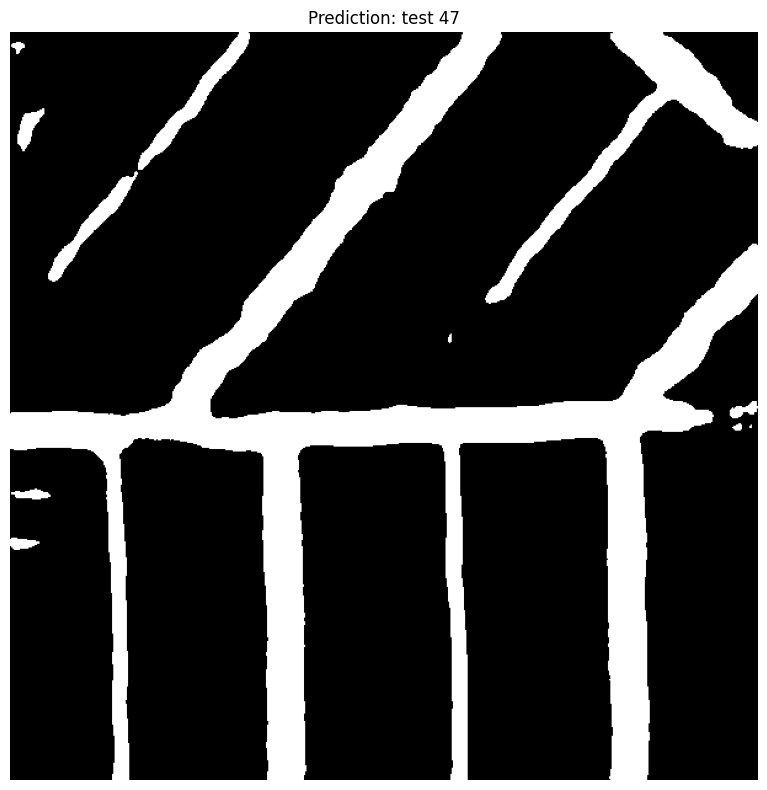

Saved plot 47 to Unet_prediction/test_47.png.


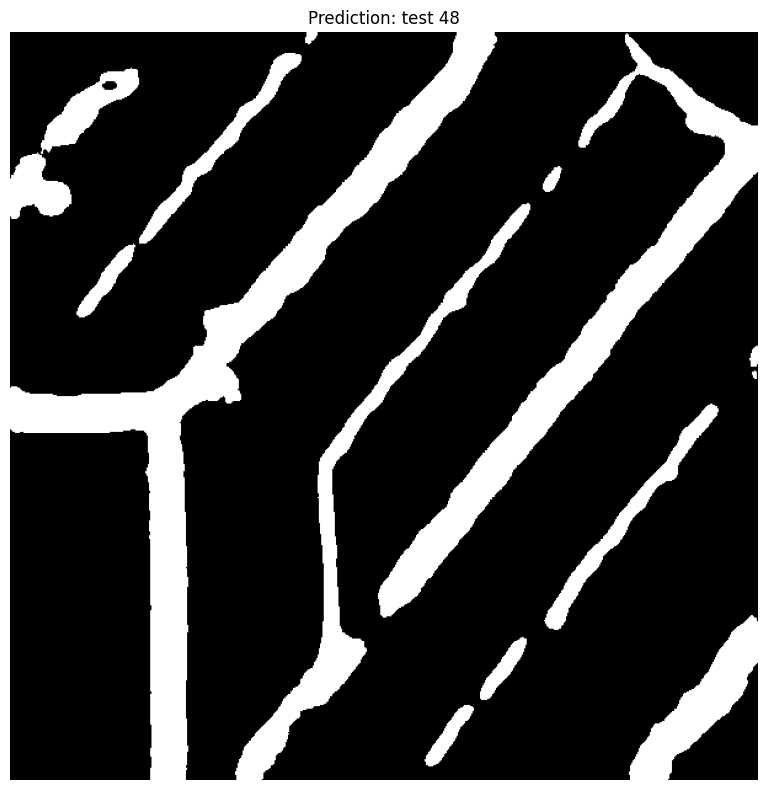

Saved plot 48 to Unet_prediction/test_48.png.


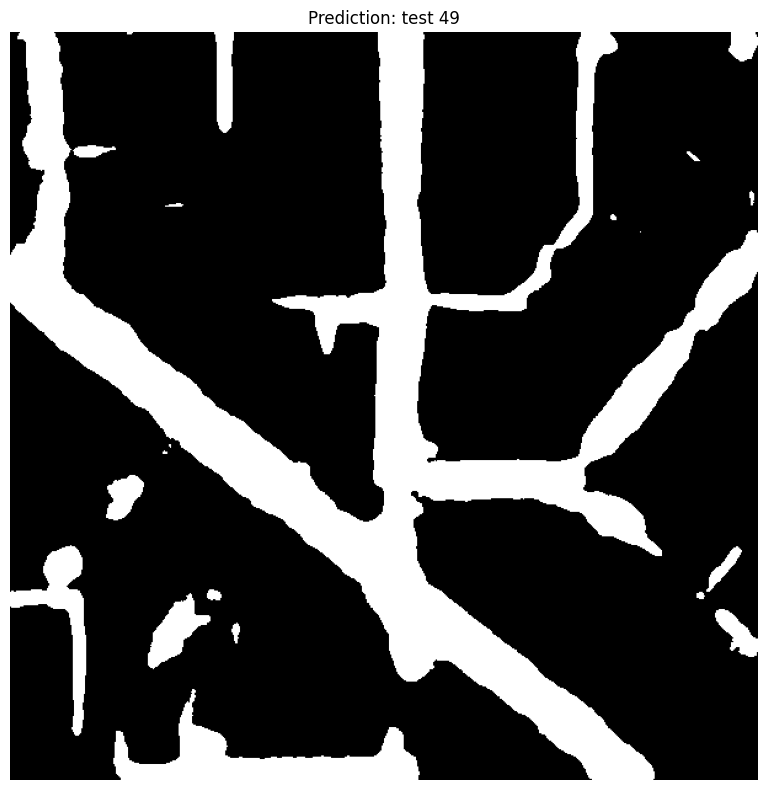

Saved plot 49 to Unet_prediction/test_49.png.


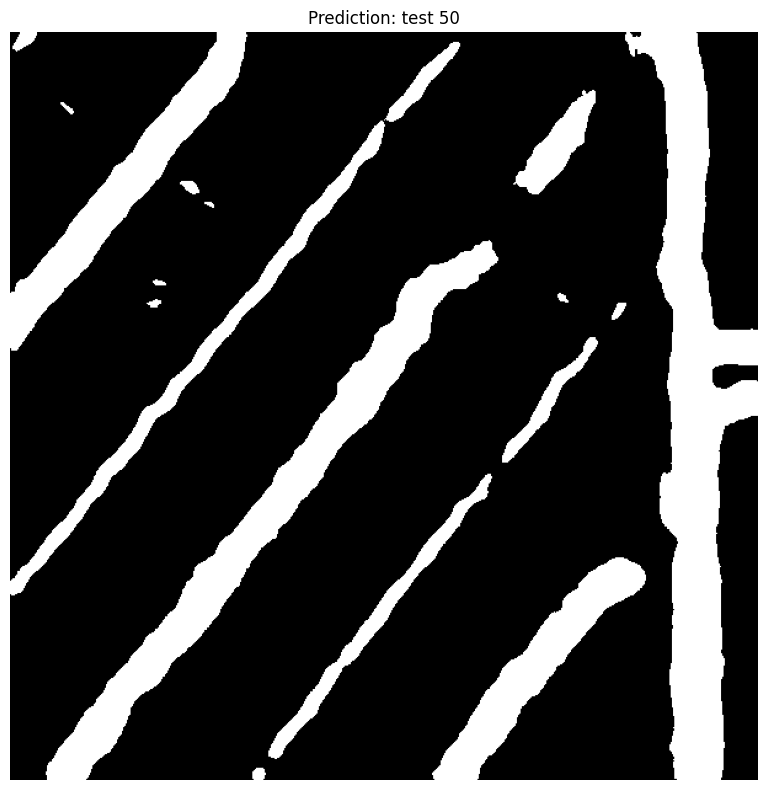

Saved plot 50 to Unet_prediction/test_50.png.
Shape of pred_img: (608, 608, 1)


In [69]:
# Save the plot to create submission later
batch_num = preds.shape[0]
sample_num = 50
batch_per_sample = batch_num/sample_num
patches_per_column = int(np.sqrt(batch_per_sample))
start_idx = 0

for sample_idx in range(sample_num):
    start = int(start_idx)
    end = int(batch_per_sample * (sample_idx + 1))

    pred_img = stitch_patches(preds[start:end, :, :, :], patches_per_column=patches_per_column)

    start_idx = end

    fig, ax = plt.subplots(1, 1, figsize=(16, 8))

    ax.imshow(pred_img,cmap = 'gray')
    ax.set_title(f'Prediction: test {sample_idx+1}')
    ax.axis('off')

    plt.tight_layout()
    out_dir = 'Unet_prediction'
    os.makedirs(out_dir,exist_ok=True)
    out_path = os.path.join(out_dir, f'test_{sample_idx + 1}.png')
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    print(f"Saved plot {sample_idx+1} to {out_path}.")

print(f"Shape of pred_img: {pred_img.shape}")

In [70]:
start_idx = 0
for sample_idx in range(sample_num):
    start = int(start_idx)
    end = int(batch_per_sample * (sample_idx + 1))
    pred_img = stitch_patches(preds[start:end, :, :, :], patches_per_column=patches_per_column)
    start_idx = end

    # Ensure the output directory exists
    out_dir = f'epfl_road-segmentation/test_set_images/test_{sample_idx+1}'
    os.makedirs(out_dir, exist_ok=True)

    # Save the image as 8-bit grayscale
    pred_img_8bit = (pred_img.reshape((608,608)) * 255).astype(np.uint8)  # Scale to 0-255 for saving
    save_path = os.path.join(out_dir, f'pred_{sample_idx+1}.png')
    Image.fromarray(pred_img_8bit).save(save_path)

In [71]:
import re

def patch_to_label(patch):
    df = np.mean(patch)
    if df > 0.25:
        return 1
    else:
        return 0

def mask_to_submission_strings(image_filename):
    """Reads a single image and outputs the strings that should go into the submission file"""
    img_number = int(re.search(r"\d+", image_filename).group(0))
    im = mpimg.imread(image_filename)
    patch_size = 16
    for j in range(0, im.shape[1], patch_size):
        for i in range(0, im.shape[0], patch_size):
            patch = im[i:i + patch_size, j:j + patch_size]
            label = patch_to_label(patch)
            yield("{:03d}_{}_{},{}".format(img_number, j, i, label))


def masks_to_submission(submission_filename, *image_filenames):
    """Converts images into a submission file"""
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn in image_filenames[0:]:
            f.writelines('{}\n'.format(s) for s in mask_to_submission_strings(fn))

### 5.2 Creation of the csv submission file

In [72]:
import matplotlib.image as mpimg

submission_filename = 'submission.csv'
image_filenames = []
for i in range(50):
    image_filename = f'epfl_road-segmentation/test_set_images/test_{i+1}/pred_{i+1}.png'
    print(image_filename)
    im = mpimg.imread(image_filename)
    print(f"{image_filename}: {im.shape}")
    image_filenames.append(image_filename)
masks_to_submission(submission_filename, *image_filenames)

epfl_road-segmentation/test_set_images/test_1/pred_1.png
epfl_road-segmentation/test_set_images/test_1/pred_1.png: (608, 608)
epfl_road-segmentation/test_set_images/test_2/pred_2.png
epfl_road-segmentation/test_set_images/test_2/pred_2.png: (608, 608)
epfl_road-segmentation/test_set_images/test_3/pred_3.png
epfl_road-segmentation/test_set_images/test_3/pred_3.png: (608, 608)
epfl_road-segmentation/test_set_images/test_4/pred_4.png
epfl_road-segmentation/test_set_images/test_4/pred_4.png: (608, 608)
epfl_road-segmentation/test_set_images/test_5/pred_5.png
epfl_road-segmentation/test_set_images/test_5/pred_5.png: (608, 608)
epfl_road-segmentation/test_set_images/test_6/pred_6.png
epfl_road-segmentation/test_set_images/test_6/pred_6.png: (608, 608)
epfl_road-segmentation/test_set_images/test_7/pred_7.png
epfl_road-segmentation/test_set_images/test_7/pred_7.png: (608, 608)
epfl_road-segmentation/test_set_images/test_8/pred_8.png
epfl_road-segmentation/test_set_images/test_8/pred_8.png: (60

In [56]:
!wc -l submission.csv

72201 submissionHQo.csv


## (6. Plots)
This part generate plots for the report.

In [57]:
import csv

def save_list_to_csv(data_list, file_name):
    """
    Saves the values from a list into a CSV file.

    Parameters:
    data_list (list): The list of values to save.
    file_name (str): The name of the CSV file to save to.
    """
    try:
        with open(file_name, mode='w', newline='') as file:
            writer = csv.writer(file)
            # Write each value in the list as a separate row
            for value in data_list:
                writer.writerow([value])
        print(f"List saved to {file_name} successfully.")
    except Exception as e:
        print(f"An error occurred while saving the list: {e}")

save_list_to_csv(loss_training, 'loss_training.csv')
save_list_to_csv(f1_training, 'f1_training.csv')
save_list_to_csv(loss_validation, 'loss_validation.csv')
save_list_to_csv(f1_validation, 'f1_validation.csv')
save_list_to_csv(oa_training, 'oa_training.csv')
save_list_to_csv(oa_validation, 'oa_validation.csv')

List saved to loss_training.csv successfully.
List saved to f1_training.csv successfully.
List saved to loss_validation.csv successfully.
List saved to f1_validation.csv successfully.
List saved to oa_training.csv successfully.
List saved to oa_validation.csv successfully.


### 6.1 Loss Plot

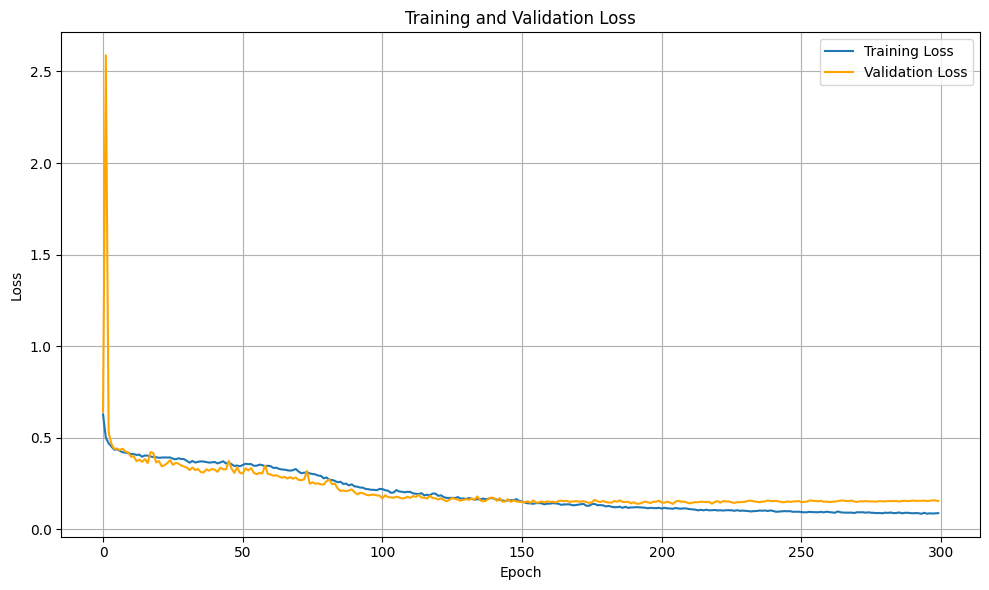

In [58]:
# Plot both lists on the same graph
plt.figure(figsize=(10, 6))
labels = ['Training Loss', 'Validation Loss']

# Plot training loss
plt.plot(loss_training, marker='', label=labels[0])

# Plot validation loss
plt.plot(loss_validation, marker='', label=labels[1], color='orange')

# Add titles, labels, and legend
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### 6.2 F1 Plot

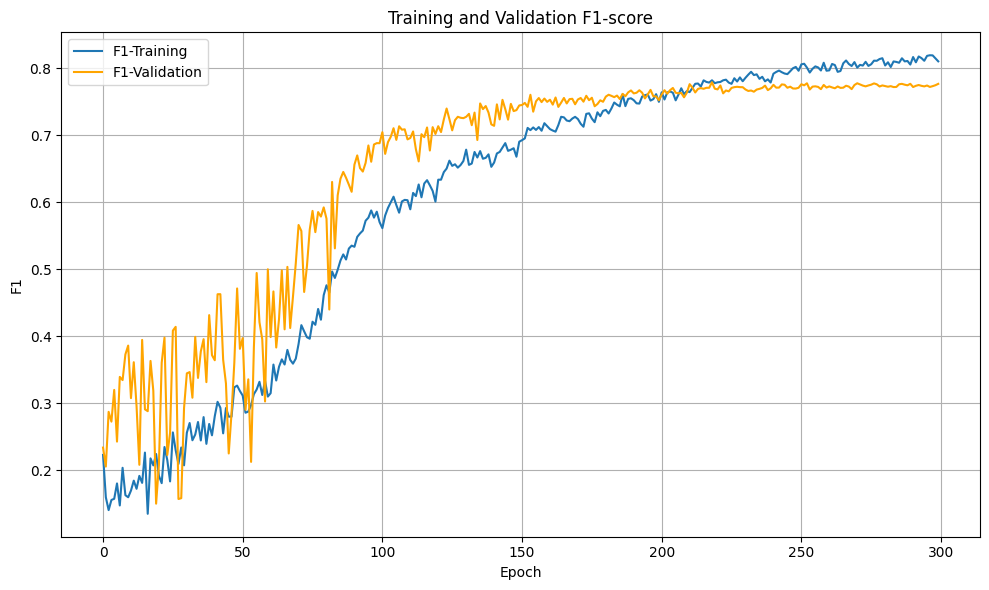

In [63]:
# Plot both lists on the same graph
plt.figure(figsize=(10, 6))
labels2 = ['F1-Training', 'F1-Validation']

# Plot training loss
plt.plot(f1_training, marker='', label=labels2[0])

# Plot validation loss
plt.plot(f1_validation, marker='', label=labels2[1], color='orange')

# Add titles, labels, and legend
plt.title("Training and Validation F1-score")
plt.xlabel("Epoch")
plt.ylabel("F1")
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### 6.3 Overall Accuracy Plot

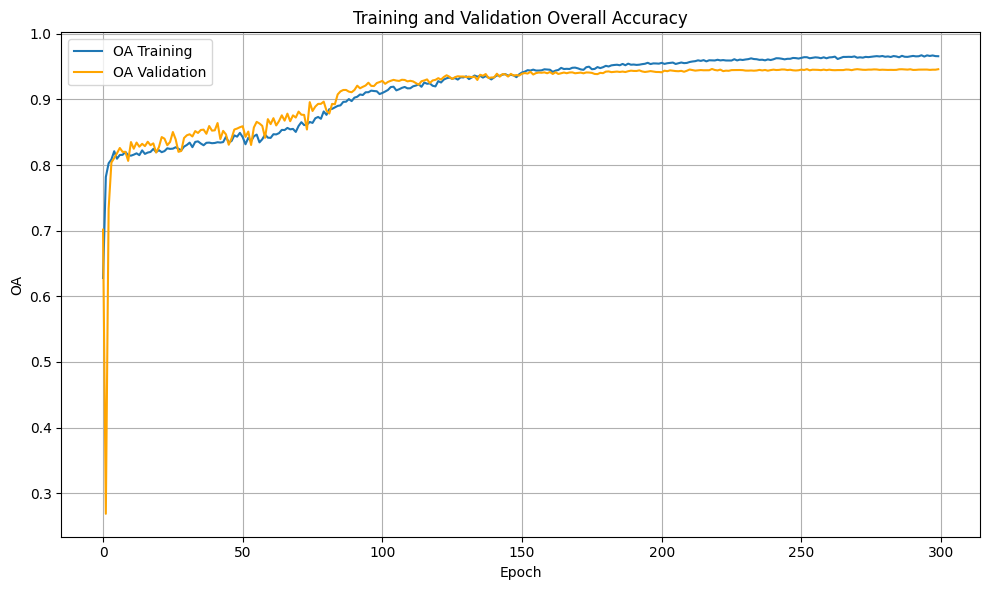

In [73]:
# Plot both lists on the same graph
plt.figure(figsize=(10, 6))
labels2 = ['OA Training', 'OA Validation']

# Plot training loss
plt.plot(oa_training, marker='', label=labels2[0])

# Plot validation loss
plt.plot(oa_validation, marker='', label=labels2[1], color='orange')

# Add titles, labels, and legend
plt.title("Training and Validation Overall Accuracy")
plt.xlabel("Epoch")
plt.ylabel("OA")
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()